# <span style="color:darkviolet">Classification Project</span>
# <span style="color:darkviolet">Decistion Trees, Random Forest, and Support Vector Machine</span>

## <span style="color:purple">Mobiles Prices Predictions</span>

### What I am about to do:
1- Importing the libraries<br>
2- Reading the datasets<br>
3- Cleaning and pre-processing the DataFrames<br>

4- DataFrame visualizations<br>
    4-1- Scatter plots<br>
    4-2- Joint plot<br>
    4-3- Pie plots<br>
    4-4- Pair plots<br>
    4-5- Box plots<br>
    
5- Pattern recognition<br>
    (Exploratory Data Analysis (EDA))<br>
    5-1- Univariate Analysis<br>
    5-2- Bivariate Analysis<br>
    5-3- Multivariate Analysis<br>
    
6- Implementing models such as DTs, RF, and SVM<br>
    Normalizing<br>
    6-1- Decision Trees<br>
    6-2- Random Forest<br>
    6-3- SVM (Support Vector Machine)<br>
    
7- Get the second dataset predicted results

***

## <span style="color:green">1. Importing the libraries</span>

First, import libraries:

In [ ]:
# basic libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# modeling libraries
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

import warnings
warnings.filterwarnings('ignore')

- We may need other libraries in the future, which we will call at the appropriate time.

***

## <span style="color:green">2. Reading the datasets</span>

The dataset encompasses details on 2000 mobile devices, providing information on 21 specifications, including battery power, Bluetooth, and more. Within this dataset, the mobiles are divided into four distinct price groups. Crucially, there are no missing or NaN values in the dataset. It features a blend of numerical and categorical attributes, with all categorical data being expressed numerically.

This is the description of the columns of the dataset:

1) **battery_power**: Total energy a battery can store in one time measured in mAh. `(842, 1021, 563, ...)`
2) **blue**: Has bluetooth or not. `(0 or 1)`
3) **clock_speed**: Speed at which microprocessor executes instructions. `(2.2, 0.5, 0.5, ...)`
4) **dual_sim**: Has dual sim supprt or not. `(0 or 1)`
5) **fc**: Front camera Mega pixels. `(0 or 1)`
6) **four_g**: Has 4G or not. `(0 or 1)`
7) **int_memory**: Internal memory in Giga Bytes. `(7, 53, 41, ...)`
8) **m_dep**: Mobile depth in cm. `(0.6, 0.7, 0.9, ...)`
9) **mobile_wt**: Weight of mobile phone. `(188, 136, 145, ...)`
10) **n_cores**: Number of cores of processor. `(2, 3, 5, ...)`
11) **pc**: Primary camera in Mega Bytes. `(2, 6, 6, ...)`
12) **px_height**:  Pixel resolution height. `(20, 905, 1263, ...)`
13) **px_width**: Pixel resolution width. `(756, 1988, 1716, ...)`
14) **ram**: Random access memory in Mega Bytes. `(2549, 2631, 2603, ...)`
15) **sc_h**: Screen height of mobile in cm. `(9, 17, 11, ...)`
16) **sc_w**: Screen width of mobile in cm. `(7, 3, 2, ...)`
17) **talk_time**: Longest time that a single battery charge will last when you are. `(19, 7, 9, ...)`
18) **three_g**: Has 3G or not. `(0 or 1)`
19) **touch_screen**: Has touch screen or not. `(0 or 1)`
20) **wifi**: Has wifi or not. `(0 or 1)`
21) **price_range**: This is the `Target` variable with value of 0 (low cost), 1 (medium cost), 2 (high cost), and 3 (very high cost). `(0 or 1 or 2 or or 3)`

Reading the datasets:

In [ ]:
# the 'train' part of our probelm dataset
Training_Dataset = pd.read_csv("/kaggle/input/mobile-price-intermediate-dataset/Mobile_Price_Prediction_train.csv")

# the 'test' part of our probelm dataset
NoneLabel_Dataset = pd.read_csv("/kaggle/input/mobile-price-intermediate-dataset/Mobile_Price_Prediction_test.csv")

***

Converting both to two DataFrames:

In [ ]:
df_train = pd.DataFrame (Training_Dataset)
df_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [ ]:
df_test = pd.DataFrame (NoneLabel_Dataset)
df_test

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,1700,1,1.9,0,0,1,54,0.5,170,...,17,644,913,2121,14,8,15,1,1,0
996,997,609,0,1.8,1,0,0,13,0.9,186,...,2,1152,1632,1933,8,1,19,0,1,1
997,998,1185,0,1.4,0,1,1,8,0.5,80,...,12,477,825,1223,5,0,14,1,0,0
998,999,1533,1,0.5,1,0,0,50,0.4,171,...,12,38,832,2509,15,11,6,0,1,0


***

Checking for invalid values inside the **train DataFrame** will be:

In [ ]:
for col in df_train:
    print(f"{col:15} has {df_train[col].nunique():5} unique value")

battery_power   has  1094 unique value
blue            has     2 unique value
clock_speed     has    26 unique value
dual_sim        has     2 unique value
fc              has    20 unique value
four_g          has     2 unique value
int_memory      has    63 unique value
m_dep           has    10 unique value
mobile_wt       has   121 unique value
n_cores         has     8 unique value
pc              has    21 unique value
px_height       has  1137 unique value
px_width        has  1109 unique value
ram             has  1562 unique value
sc_h            has    15 unique value
sc_w            has    19 unique value
talk_time       has    19 unique value
three_g         has     2 unique value
touch_screen    has     2 unique value
wifi            has     2 unique value
price_range     has     4 unique value


- For example in the 'price_range' column, as we already said, we have these values: 0 or 1 or 2 or 3, and this means that we have '4 unique values' in it.

With this command in below we can see these unique values one by one:

In [ ]:
# we only check some for an example
features_categorical = ['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range']
for col in features_categorical:
    print('-' * 17)
    print(f"{col}:\n{df_train[col].unique()}")
    print('_' * 17)

-----------------
blue:
[0 1]
_________________
-----------------
dual_sim:
[0 1]
_________________
-----------------
four_g:
[0 1]
_________________
-----------------
n_cores:
[2 3 5 6 1 8 4 7]
_________________
-----------------
three_g:
[0 1]
_________________
-----------------
touch_screen:
[0 1]
_________________
-----------------
wifi:
[1 0]
_________________
-----------------
price_range:
[1 2 3 0]
_________________


In [ ]:
# you can do it for the rest of numerical columns as well but it is not recommeded
features_numerical = set(df_train.columns) - set(features_categorical) # we didn't mentioned it again one by one
for col in features_numerical:
    print('-' * 75)
    print(f"{col}:\n{df_train[col].unique()}")
    print('_' * 75)

---------------------------------------------------------------------------
talk_time:
[19  7  9 11 15 10 18  5 20 12 13  2  4  3 16  6 14 17  8]
___________________________________________________________________________
---------------------------------------------------------------------------
px_width:
[ 756 1988 1716 ...  743 1890 1632]
___________________________________________________________________________
---------------------------------------------------------------------------
int_memory:
[ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]
___________________________________________________________________________
---------------------------------------------------------------------------
battery_power:
[ 842 1021  563 ... 1139 1467  858]
___________________________________________________________________________
--------------------

- Based on the aforementioned outcomes and column types, we ascertain the absence of any invalid values.
- Now, let's proceed to examine for any missing values.

***

Checking for invalid values inside the **test DataFrame** will be:

In [ ]:
for col in df_test:
    print(f"{col:13} has {df_test[col].nunique():4} unique value")

id            has 1000 unique value
battery_power has  721 unique value
blue          has    2 unique value
clock_speed   has   26 unique value
dual_sim      has    2 unique value
fc            has   20 unique value
four_g        has    2 unique value
int_memory    has   63 unique value
m_dep         has   10 unique value
mobile_wt     has  121 unique value
n_cores       has    8 unique value
pc            has   21 unique value
px_height     has  694 unique value
px_width      has  743 unique value
ram           has  872 unique value
sc_h          has   15 unique value
sc_w          has   19 unique value
talk_time     has   19 unique value
three_g       has    2 unique value
touch_screen  has    2 unique value
wifi          has    2 unique value


With this command in below we can see these unique values one by one:

In [ ]:
# we only check some for an example
features_categorical_test = ['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi'] # cause this is the prediction DataFrame, we don't have the 'price_range' column in here
for col in features_categorical_test:
    print('-' * 17)
    print(f"{col}:\n{df_test[col].unique()}")
    print('_' * 17)

-----------------
blue:
[1 0]
_________________
-----------------
dual_sim:
[1 0]
_________________
-----------------
four_g:
[0 1]
_________________
-----------------
n_cores:
[3 5 8 6 2 1 7 4]
_________________
-----------------
three_g:
[0 1]
_________________
-----------------
touch_screen:
[1 0]
_________________
-----------------
wifi:
[0 1]
_________________


In [ ]:
# you can do it for the rest of numerical columns as well but it is not recommeded
features_numerical_test = set(df_test.columns) - set(features_categorical_test) # we didn't mentioned it again one by one
for col in features_numerical_test:
    print('-' * 75)
    print(f"{col}:\n{df_test[col].unique()}")
    print('_' * 75)

---------------------------------------------------------------------------
talk_time:
[ 2  7 10  3 18  5 20  8 16 14 15  6  9 13 12 17 11  4 19]
___________________________________________________________________________
---------------------------------------------------------------------------
px_width:
[1412  857 1366 1752  810  939 1374 1880  876 1009 1336 1671 1893 1856
 1323 1832 1511  532 1771  559 1930 1591 1587 1111 1321 1306 1200  658
  630 1048 1408  643 1633  992 1904 1777 1557  847  528  566 1892  851
  633  972  748 1234  610 1896 1867  816  764 1695  663 1360 1022 1871
 1788  666  755 1113  647  667  636 1345 1552 1508 1361 1386 1808  702
 1660  882 1704 1078 1015 1597  911 1371  900 1256 1427 1585  653 1499
  797  661  709 1100 1014 1416  886 1949  920  974 1864 1157 1463 1003
  627 1872  692 1829 1945  921  836 1115 1062 1609 1205  910 1684 1110
  769 1989 1821 1358  856  538 1138  683 1443 1673 1297 1682 1917  894
 1743 1061  555 1715 1718 1801 1405 1498 1148  718  8

***

### <font color='crimson'>Here we want to check each column in terms of the logic of the numbers and values inside them. If something doesn't make sense, we will check it and take the necessary measures.</font>

**Checking our features one by one for the last time:**

When you receive a dataset, make sure to thoroughly check everything. The owner provides you with raw data, and it's our responsibility to extract relevant information from that data before implementing the model. Here, we re-evaluated columns for their content and acceptability.

For instance, we deemed a width ('sc_w') less than 2 mm meaningless, and accordingly, we filtered values above this threshold. Subsequently, I created a new DataFrame for this purpose. Within this new DataFrame, I also established indexes to ensure a neat and orderly arrangement in the end.

In [ ]:
# 1 - battery_power
df_train["battery_power"].describe()

count    2000.000000
mean     1238.518500
std       439.418206
min       501.000000
25%       851.750000
50%      1226.000000
75%      1615.250000
max      1998.000000
Name: battery_power, dtype: float64

- It seems fine.

In [ ]:
# 2 - blue
df_train["blue"].describe()

count    2000.0000
mean        0.4950
std         0.5001
min         0.0000
25%         0.0000
50%         0.0000
75%         1.0000
max         1.0000
Name: blue, dtype: float64

- This column says whether it has Bluetooth or not, that's all.
- Everything seems logical.

In [ ]:
# 3 - clock_speed
df_train["clock_speed"].describe()

count    2000.000000
mean        1.522250
std         0.816004
min         0.500000
25%         0.700000
50%         1.500000
75%         2.200000
max         3.000000
Name: clock_speed, dtype: float64

- It seems OK.

In [ ]:
# 4 - dual_sim
df_train["dual_sim"].describe()

count    2000.000000
mean        0.509500
std         0.500035
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: dual_sim, dtype: float64

- It seems OK as well.

In [ ]:
# 5 - fc
df_train["fc"].describe()

count    2000.000000
mean        4.309500
std         4.341444
min         0.000000
25%         1.000000
50%         3.000000
75%         7.000000
max        19.000000
Name: fc, dtype: float64

Here you can consider why the front camera should have zero pixels, and remove the value from the dataset, but we don't do that. This is also because a mobile phone may not have a front camera at all (because we don't know what year and time the data belongs to, it may be old) and because of the lack of a front camera, zero pixels have been considered.

In [ ]:
# 6 - four_g
df_train["four_g"].describe()

count    2000.000000
mean        0.521500
std         0.499662
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: four_g, dtype: float64

- It seems good.

In [ ]:
# 7 - int_memory
df_train["int_memory"].describe()

count    2000.000000
mean       32.046500
std        18.145715
min         2.000000
25%        16.000000
50%        32.000000
75%        48.000000
max        64.000000
Name: int_memory, dtype: float64

- All seems to be logical.

In [ ]:
# 8 - m_dep
df_train["m_dep"].describe()

count    2000.000000
mean        0.501750
std         0.288416
min         0.100000
25%         0.200000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

- It is normal for the phone to have a depth of 0.1 cm to 1 cm.

In [ ]:
# 9 - mobile_wt
df_train["mobile_wt"].describe()

count    2000.000000
mean      140.249000
std        35.399655
min        80.000000
25%       109.000000
50%       141.000000
75%       170.000000
max       200.000000
Name: mobile_wt, dtype: float64

- It seems fine, too.

In [ ]:
# 10 - n_cores
df_train["n_cores"].describe()

count    2000.000000
mean        4.520500
std         2.287837
min         1.000000
25%         3.000000
50%         4.000000
75%         7.000000
max         8.000000
Name: n_cores, dtype: float64

- This column shows that mobiles can have from 1 to 8 processors and the numbers in this column seem reasonable.

In [ ]:
# 11 - pc
df_train["pc"].describe()

count    2000.000000
mean        9.916500
std         6.064315
min         0.000000
25%         5.000000
50%        10.000000
75%        15.000000
max        20.000000
Name: pc, dtype: float64

- We can interpret this according to the logic used for the front camera (fc) of the phone. With the theme that a phone can not even have a rear camera (main camera, pc) or its camera quality can be up to 20 megapixels.

In [ ]:
# 12 - px_height
df_train["px_height"].describe()

count    2000.000000
mean      645.108000
std       443.780811
min         0.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

- Here, when we checked, we saw that we also have a value of 0, if it is not logical! The mobile phone must have at least 1 pixel! So we go to remove 0 values.

In [ ]:
df_train = df_train[df_train['px_height'] != 0]

In [ ]:
df_train["px_height"].describe()

count    1998.000000
mean      645.753754
std       443.532906
min         1.000000
25%       284.000000
50%       565.500000
75%       947.750000
max      1960.000000
Name: px_height, dtype: float64

- Ok! The zero value has gone!

In [ ]:
# 13 - px_width
df_train["px_width"].describe()

count    1998.000000
mean     1251.276276
std       432.064000
min       500.000000
25%       874.250000
50%      1247.000000
75%      1632.750000
max      1998.000000
Name: px_width, dtype: float64

- All seems reasonable.

In [ ]:
# 14 - ram
df_train["ram"].describe()

count    1998.000000
mean     2123.511512
std      1084.701280
min       256.000000
25%      1206.500000
50%      2146.500000
75%      3063.750000
max      3998.000000
Name: ram, dtype: float64

- It looks good as well.

In [ ]:
# 15 - sc_h
df_train["sc_h"].describe()

count    1998.000000
mean       12.308809
std         4.213652
min         5.000000
25%         9.000000
50%        12.000000
75%        16.000000
max        19.000000
Name: sc_h, dtype: float64

- Fine, ok.

In [ ]:
# 16 - sc_w
df_train["sc_w"].describe()

count    1998.000000
mean        5.770270
std         4.356633
min         0.000000
25%         2.000000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

- Oh oh! The page width cannot be zero! So we have to fix this too.

In [ ]:
df_train = df_train[df_train['sc_w'] >= 2]

In [ ]:
df_train["sc_w"].describe()

count    1609.000000
mean        7.034804
std         3.910699
min         2.000000
25%         4.000000
50%         6.000000
75%        10.000000
max        18.000000
Name: sc_w, dtype: float64

- Now it looks fine.

In [ ]:
# 17 - talk_time
df_train["talk_time"].describe()

count    1609.000000
mean       10.979490
std         5.476449
min         2.000000
25%         6.000000
50%        11.000000
75%        16.000000
max        20.000000
Name: talk_time, dtype: float64

- Well, it is fine.

In [ ]:
# 18 - three_g
df_train["three_g"].describe()

count    1609.000000
mean        0.766314
std         0.423306
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: three_g, dtype: float64

- It may or may not be possible to have 3G, so no problem.

In [ ]:
# 19 - touch_screen
df_train["touch_screen"].describe()

count    1609.000000
mean        0.505904
std         0.500121
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: touch_screen, dtype: float64

- Also, fine.

In [ ]:
# 20 - wifi
df_train["wifi"].describe()

count    1609.000000
mean        0.513984
std         0.499960
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: wifi, dtype: float64

- There is no problem, then OK.

In [ ]:
# 21 - price_range
df_train["price_range"].describe()

count    1609.000000
mean        1.494717
std         1.115864
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max         3.000000
Name: price_range, dtype: float64

- And, as the last column to check, it is also fine and has no problem!

Just in case we messed with the indices, we rectify it with:

In [ ]:
df_train.reset_index(inplace=True)

We also don't need the 'index' column, so let's remove that, too:

In [ ]:
df_train.drop('index', axis=1, inplace=True)

- So! Our train DataFrame is super readyyy!

Let's go for the other DataFrame of us, the test DataFrame.<br>
It's important to note that any modifications made to our initial DataFrame (training) should also be reflected in the second DataFrame (test).<br>
We are working with two DataFrame, The first DataFrame is utilized for checking and constructing the model, while the second DataFrame is employed for predicting their values.<br>
So, let's apply the same steps to the two edited columns, 'px_height' and 'sc_w':

In [ ]:
# px_height in test DataFrame
df_test["px_height"].describe()

count    1000.000000
mean      627.121000
std       432.929699
min         0.000000
25%       263.750000
50%       564.500000
75%       903.000000
max      1907.000000
Name: px_height, dtype: float64

- As you can see we have the '0' value, it is not good.

In [ ]:
df_test = df_test[df_test['px_height'] != 0]

In [ ]:
df_test["px_height"].describe()

count     998.000000
mean      628.377756
std       432.450690
min         2.000000
25%       265.750000
50%       565.000000
75%       905.000000
max      1907.000000
Name: px_height, dtype: float64

- DONE!

In [ ]:
# sc_w in test DataFrame
df_test["sc_w"].describe()

count    998.000000
mean       5.315631
std        4.244245
min        0.000000
25%        2.000000
50%        5.000000
75%        8.000000
max       18.000000
Name: sc_w, dtype: float64

- As you can see we have the '0' value also in here, it is not good again.

In [ ]:
df_test = df_test[df_test['sc_w'] >= 2]

In [ ]:
df_test["sc_w"].describe()

count    787.000000
mean       6.614994
std        3.845347
min        2.000000
25%        4.000000
50%        6.000000
75%        9.000000
max       18.000000
Name: sc_w, dtype: float64

- DONE!

Just in case we messed with the indices, we rectify it with:

In [ ]:
df_test.reset_index(inplace=True)

We also don't need the 'index' column, so let's remove that, too:

In [ ]:
df_test.drop('index', axis=1, inplace=True)

- So! Our test DataFrame is super readyyy as well!

***

## <span style="color:green">3. Cleaning and pre-processing the DataFrames</span>

Let's take a look at our DataFrames:

***The train one,***

Check the DataFrame for the information inside it:

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1609 entries, 0 to 1608
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1609 non-null   int64  
 1   blue           1609 non-null   int64  
 2   clock_speed    1609 non-null   float64
 3   dual_sim       1609 non-null   int64  
 4   fc             1609 non-null   int64  
 5   four_g         1609 non-null   int64  
 6   int_memory     1609 non-null   int64  
 7   m_dep          1609 non-null   float64
 8   mobile_wt      1609 non-null   int64  
 9   n_cores        1609 non-null   int64  
 10  pc             1609 non-null   int64  
 11  px_height      1609 non-null   int64  
 12  px_width       1609 non-null   int64  
 13  ram            1609 non-null   int64  
 14  sc_h           1609 non-null   int64  
 15  sc_w           1609 non-null   int64  
 16  talk_time      1609 non-null   int64  
 17  three_g        1609 non-null   int64  
 18  touch_sc

In [ ]:
df_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


The whole dataset of us is numerical but we say 'all' in '.describe()' command.

In [ ]:
df_train.describe(include='all')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,...,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000,1609.000000
mean,1233.488502,0.504040,1.508888,0.504661,4.293971,0.528900,32.298322,0.500497,140.101305,4.527035,...,651.065879,1254.537601,2120.180236,12.756992,7.034804,10.979490,0.766314,0.505904,0.513984,1.494717
std,439.673248,0.500139,0.810635,0.500134,4.329836,0.499319,18.215317,0.289148,35.428775,2.289261,...,447.537257,433.410008,1084.384541,4.088722,3.910699,5.476449,0.423306,0.500121,0.499960,1.115864
min,501.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,2.000000,500.000000,256.000000,5.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,842.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,286.000000,876.000000,1201.000000,9.000000,4.000000,6.000000,1.000000,0.000000,0.000000,0.000000
50%,1224.000000,1.000000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,5.000000,...,567.000000,1258.000000,2156.000000,13.000000,6.000000,11.000000,1.000000,1.000000,1.000000,1.000000
75%,1604.000000,1.000000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,956.000000,1633.000000,3035.000000,16.000000,10.000000,16.000000,1.000000,1.000000,1.000000,2.000000
max,1998.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


- This dataset has 2000 rows.
- This dataset has 21 columns which I described earlier.
- The 'price_range' is our `Target` column.
- Other columns are our features.
- We will drop some columns and values in the future, because they're not necessary to have.
- It seems to be no Missing Values but we'll check more.

### Missing Values:

In [ ]:
print(df_train.isnull().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


In [ ]:
# this is another form of Missing value checking
df_train.isna().sum().to_frame()

,0
battery_power,0
blue,0
clock_speed,0
dual_sim,0
fc,0
four_g,0
int_memory,0
m_dep,0
mobile_wt,0
n_cores,0


- As we checked, we have no Missing Values.

- It seems like that we don't have any Missing Values. Because when we look at the count of the describe command, we see all the values are the same.
- As we look more closer, we can see that some data are objective and they are not continuous, they look discrete and not continuous. For these kind of values, we should not consider their 'mean', 'std' and some other values, because their are some categorical, discretal, and non-continuous values in which these parameters doesn't mean anything at all.

***

***The test one,***

Check the DataFrame for the information inside it:

In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             787 non-null    int64  
 1   battery_power  787 non-null    int64  
 2   blue           787 non-null    int64  
 3   clock_speed    787 non-null    float64
 4   dual_sim       787 non-null    int64  
 5   fc             787 non-null    int64  
 6   four_g         787 non-null    int64  
 7   int_memory     787 non-null    int64  
 8   m_dep          787 non-null    float64
 9   mobile_wt      787 non-null    int64  
 10  n_cores        787 non-null    int64  
 11  pc             787 non-null    int64  
 12  px_height      787 non-null    int64  
 13  px_width       787 non-null    int64  
 14  ram            787 non-null    int64  
 15  sc_h           787 non-null    int64  
 16  sc_w           787 non-null    int64  
 17  talk_time      787 non-null    int64  
 18  three_g   

In [ ]:
df_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
2,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1
3,6,1464,1,2.9,1,5,1,50,0.8,198,...,9,569,939,3506,10,7,3,1,1,1
4,7,1718,0,2.4,0,1,0,47,1.0,156,...,3,1283,1374,3873,14,2,10,0,0,0


The whole dataset of us is numerical but we say 'all' in '.describe()' command.

In [ ]:
df_test.describe(include='all')

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,...,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000,787.000000
mean,504.059720,1238.570521,0.523507,1.537357,0.513342,4.644219,0.490470,33.824651,0.518679,140.059720,...,10.081321,644.795426,1245.664549,2131.959339,12.503177,6.614994,11.237611,0.757306,0.496823,0.512071
std,287.750197,433.597506,0.499765,0.829775,0.500140,4.437634,0.500227,18.118349,0.282202,35.323553,...,6.002204,445.520504,442.130591,1089.257063,4.182957,3.845347,5.484951,0.428984,0.500308,0.500172
min,1.000000,500.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,...,0.000000,2.000000,501.000000,263.000000,5.000000,2.000000,2.000000,0.000000,0.000000,0.000000
25%,258.500000,888.000000,0.000000,0.700000,0.000000,1.000000,0.000000,18.500000,0.300000,110.000000,...,5.000000,264.500000,835.000000,1193.500000,9.000000,4.000000,7.000000,1.000000,0.000000,0.000000
50%,501.000000,1220.000000,1.000000,1.500000,1.000000,4.000000,0.000000,35.000000,0.500000,140.000000,...,10.000000,573.000000,1260.000000,2156.000000,13.000000,6.000000,11.000000,1.000000,0.000000,1.000000
75%,751.500000,1627.500000,1.000000,2.300000,1.000000,7.000000,1.000000,49.000000,0.800000,171.000000,...,15.500000,936.500000,1644.000000,3067.000000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000
max,1000.000000,1999.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,...,20.000000,1907.000000,1998.000000,3989.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000


- It seems like that we don't have any Missing Values. Because when we look at the count of the describe command, we see all the values are the same.
- As we look more closer, we can see that some data are objective and they are not continuous, they look discrete and not continuous. For these kind of values, we should not consider their 'mean', 'std' and some other values, because their are some categorical, discretal, and non-continuous values in which these parameters doesn't mean anything at all.

### Missing Values:

In [ ]:
print(df_test.isnull().sum())

id               0
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
dtype: int64


In [ ]:
# this is another form of Missing value checking
df_test.isna().sum().to_frame()

,0
id,0
battery_power,0
blue,0
clock_speed,0
dual_sim,0
fc,0
four_g,0
int_memory,0
m_dep,0
mobile_wt,0


- As we checked, we have no Missing Values.

***

- Remember and pay attention that, when you have two datasets like above, one is for train and one is for test, and for your test you don't have the target, you must look upon the '.descibe()' of both of them and they must be close to each other.
- We checked each feature of each datasets mean (for example) at it seems ok, so we go for the next level.

***

At last, check for duplicated rows and values:

In [ ]:
df_train.duplicated().sum()

0

In [ ]:
df_test.duplicated().sum()

0

- So, there aren't any!

***

## <span style="color:green">4. DataFrame visualizations</span>

For checking if there is any Missing Value or Noise, we have to go for plotting.

At first, take a look at what are inside again:

In [ ]:
# this is another way of seeing what is inside except the '.describe()' command
pd.set_option('display.max_rows', 25)
round(df_train.describe().T, 2)

,count,mean,std,min,25%,50%,75%,max
battery_power,1609.0,1233.49,439.67,501.0,842.0,1224.0,1604.0,1998.0
blue,1609.0,0.50,0.50,0.0,0.0,1.0,1.0,1.0
clock_speed,1609.0,1.51,0.81,0.5,0.7,1.5,2.2,3.0
dual_sim,1609.0,0.50,0.50,0.0,0.0,1.0,1.0,1.0
fc,1609.0,4.29,4.33,0.0,1.0,3.0,7.0,19.0
four_g,1609.0,0.53,0.50,0.0,0.0,1.0,1.0,1.0
int_memory,1609.0,32.30,18.22,2.0,16.0,32.0,48.0,64.0
m_dep,1609.0,0.50,0.29,0.1,0.2,0.5,0.8,1.0
mobile_wt,1609.0,140.10,35.43,80.0,109.0,141.0,170.0,200.0
n_cores,1609.0,4.53,2.29,1.0,3.0,5.0,7.0,8.0


***

### <span style="color:green">4-1. Scatter plots</span>

**We plot every feature one by one with the target:**

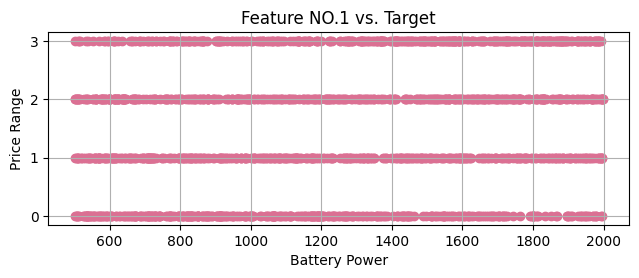

In [ ]:
# Feature number 1
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['battery_power'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.1 vs. Target")
plt.xlabel("Battery Power")
plt.ylabel("Price Range")
plt.grid()
plt.show()

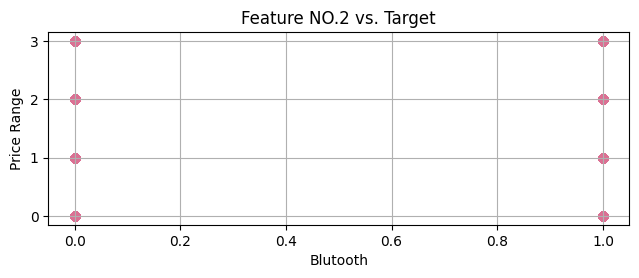

In [ ]:
# Feature number 2
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['blue'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.2 vs. Target")
plt.xlabel("Blutooth")
plt.ylabel("Price Range")
plt.grid()
plt.show()

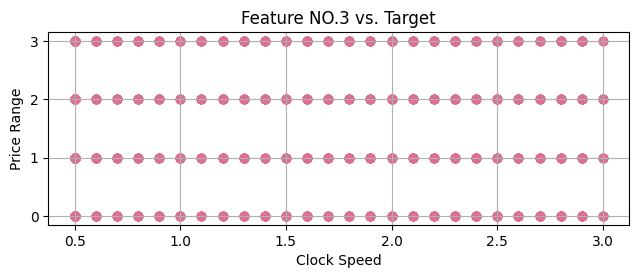

In [ ]:
# Feature number 3
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['clock_speed'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.3 vs. Target")
plt.xlabel("Clock Speed")
plt.ylabel("Price Range")
plt.grid()
plt.show()

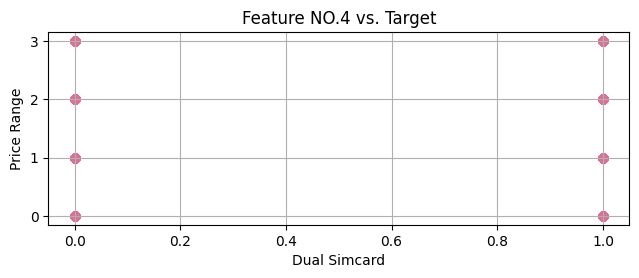

In [ ]:
# Feature number 4
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['dual_sim'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.4 vs. Target")
plt.xlabel("Dual Simcard")
plt.ylabel("Price Range")
plt.grid()
plt.show()

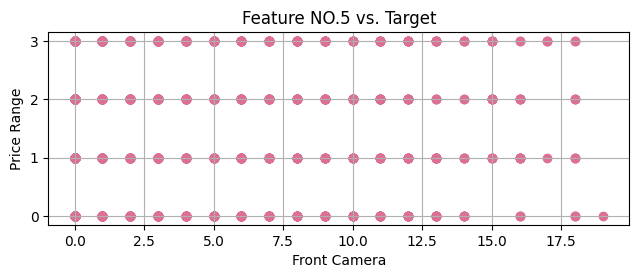

In [ ]:
# Feature number 5
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['fc'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.5 vs. Target")
plt.xlabel("Front Camera")
plt.ylabel("Price Range")
plt.grid()
plt.show()

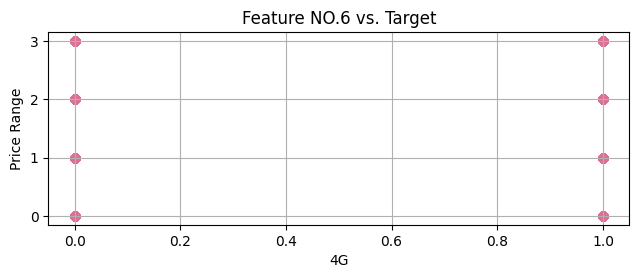

In [ ]:
# Feature number 6
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['four_g'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.6 vs. Target")
plt.xlabel("4G")
plt.ylabel("Price Range")
plt.grid()
plt.show()

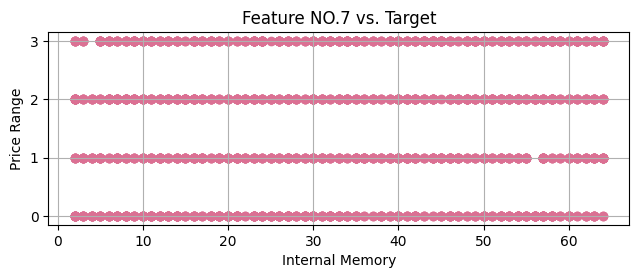

In [ ]:
# Feature number 7
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['int_memory'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.7 vs. Target")
plt.xlabel("Internal Memory")
plt.ylabel("Price Range")
plt.grid()
plt.show()

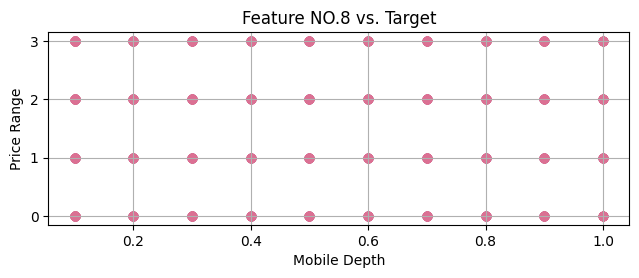

In [ ]:
# Feature number 8
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['m_dep'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.8 vs. Target")
plt.xlabel("Mobile Depth")
plt.ylabel("Price Range")
plt.grid()
plt.show()

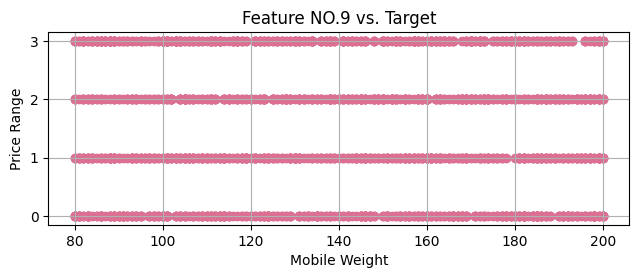

In [ ]:
# Feature number 9
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['mobile_wt'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.9 vs. Target")
plt.xlabel("Mobile Weight")
plt.ylabel("Price Range")
plt.grid()
plt.show()

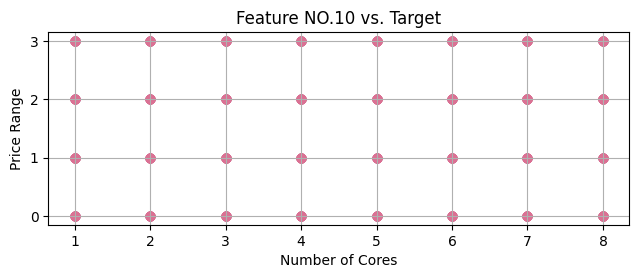

In [ ]:
# Feature number 10
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['n_cores'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.10 vs. Target")
plt.xlabel("Number of Cores")
plt.ylabel("Price Range")
plt.grid()
plt.show()

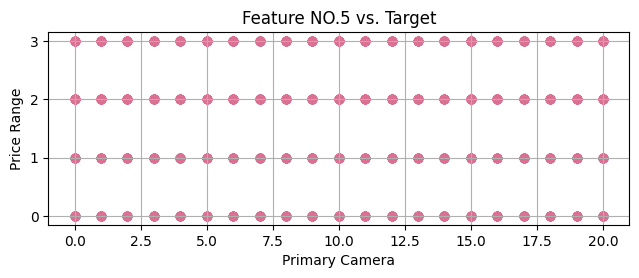

In [ ]:
# Feature number 11
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['pc'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.5 vs. Target")
plt.xlabel("Primary Camera")
plt.ylabel("Price Range")
plt.grid()
plt.show()

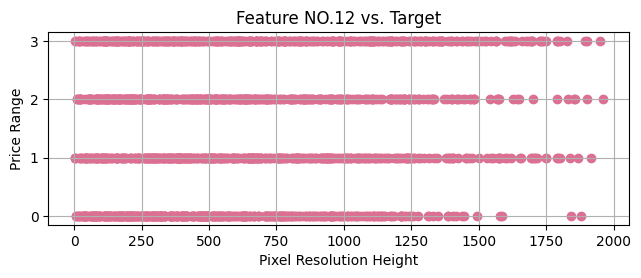

In [ ]:
# Feature number 12
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['px_height'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.12 vs. Target")
plt.xlabel("Pixel Resolution Height")
plt.ylabel("Price Range")
plt.grid()
plt.show()

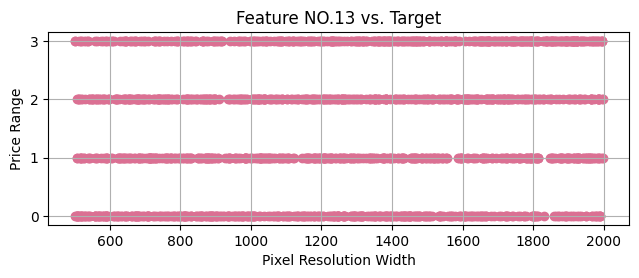

In [ ]:
# Feature number 13
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['px_width'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.13 vs. Target")
plt.xlabel("Pixel Resolution Width")
plt.ylabel("Price Range")
plt.grid()
plt.show()

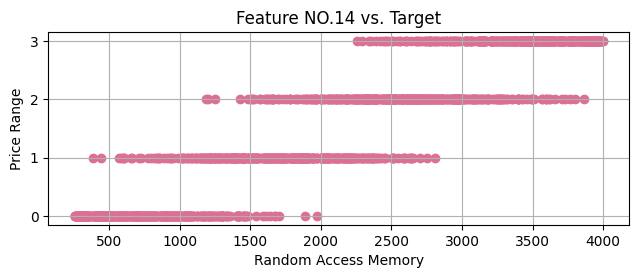

In [ ]:
# Feature number 14
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['ram'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.14 vs. Target")
plt.xlabel("Random Access Memory")
plt.ylabel("Price Range")
plt.grid()
plt.show()

- As you can see, the RAM scatter plot is very telling.
- We see a slope of 45 degrees in this plot.
- So, with the increase in the amount of RAM, we see an increase in the price range.
- This feature especially shows a high correlation with the target, which can be better understood with plots such as heatmap or jointplot (which we'll plot next after these series of plots).

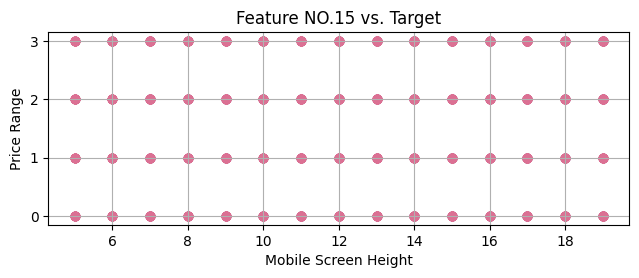

In [ ]:
# Feature number 15
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['sc_h'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.15 vs. Target")
plt.xlabel("Mobile Screen Height")
plt.ylabel("Price Range")
plt.grid()
plt.show()

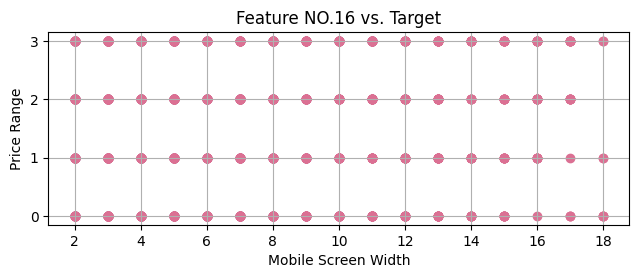

In [ ]:
# Feature number 16
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['sc_w'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.16 vs. Target")
plt.xlabel("Mobile Screen Width")
plt.ylabel("Price Range")
plt.grid()
plt.show()

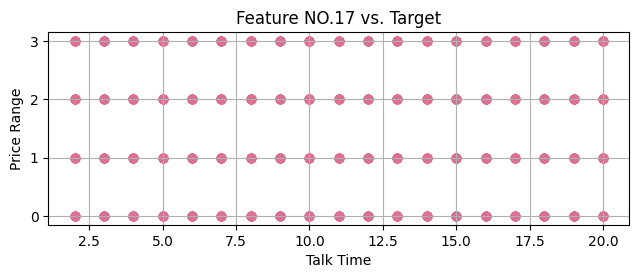

In [ ]:
# Feature number 17
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['talk_time'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.17 vs. Target")
plt.xlabel("Talk Time")
plt.ylabel("Price Range")
plt.grid()
plt.show()

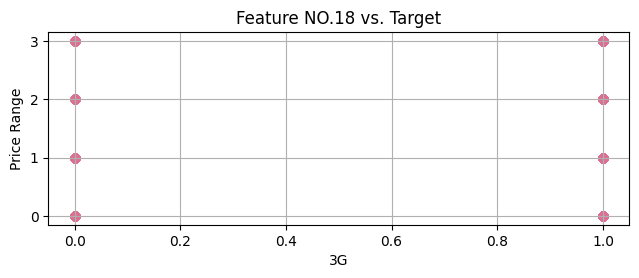

In [ ]:
# Feature number 18
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['three_g'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.18 vs. Target")
plt.xlabel("3G")
plt.ylabel("Price Range")
plt.grid()
plt.show()

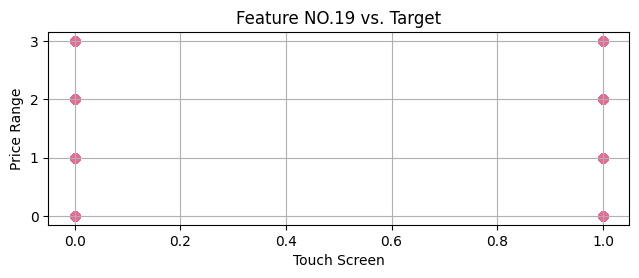

In [ ]:
# Feature number 19
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['touch_screen'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.19 vs. Target")
plt.xlabel("Touch Screen")
plt.ylabel("Price Range")
plt.grid()
plt.show()

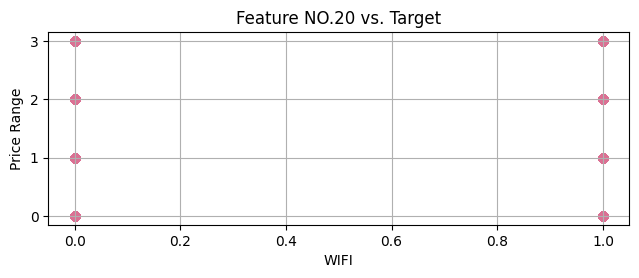

In [ ]:
# Feature number 20
plt.figure(figsize=(7.5,2.5))
plt.scatter(df_train['wifi'], df_train['price_range'], color='palevioletred')
plt.title("Feature NO.20 vs. Target")
plt.xlabel("WIFI")
plt.ylabel("Price Range")
plt.grid()
plt.show()

- Ok, plotting the scatter plots of features vs. target has finished.
- They seem like to have no Missing Values, no Noises, and no Outliers.
- So our dataset seems to be OK visually.
- But we'll go further and plot some more, too.

***

### <span style="color:green">4-2. Joint plot</span>

Earlier we talked about feature number 14 which was about RAM, now we want to see another plot of it:

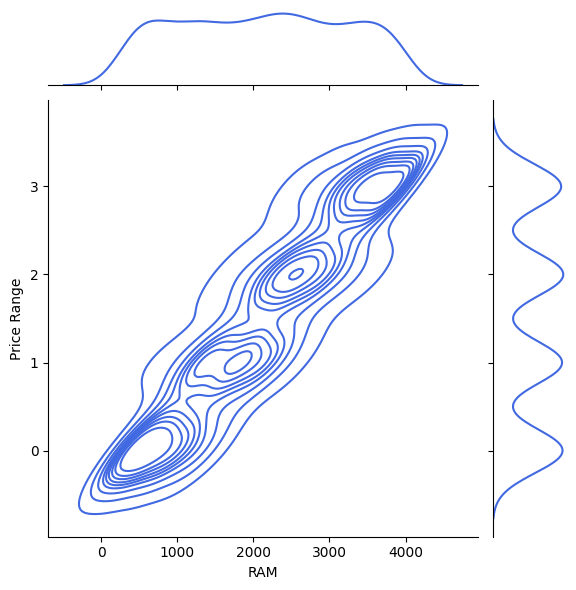

In [ ]:
sns.jointplot(x='ram', y='price_range', data=df_train, color='royalblue', kind='kde')
#plt.title("Feature NO.14 vs. Target")
plt.xlabel("RAM")
plt.ylabel("Price Range")
plt.show()

***

### <span style="color:green">4-3. Pie plots</span>

We can use pie plots in our unique value columns:

**Blutooth** column:

In [ ]:
# Counting unique values of a column
df_train['blue'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['blue'].value_counts()

blue
1    811
0    798
Name: count, dtype: int64

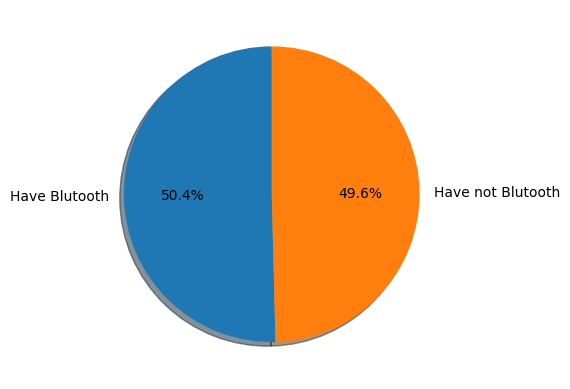

In [ ]:
# Pie Plot
values_blue = df_train['blue'].value_counts().values
labels_blue = ['Have Blutooth', 'Have not Blutooth']

fig1, ax1 = plt.subplots()
ax1.pie(values_blue, labels=labels_blue, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**Dual Simcard** column:

In [ ]:
# Counting unique values of a column
df_train['dual_sim'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['dual_sim'].value_counts()

dual_sim
1    812
0    797
Name: count, dtype: int64

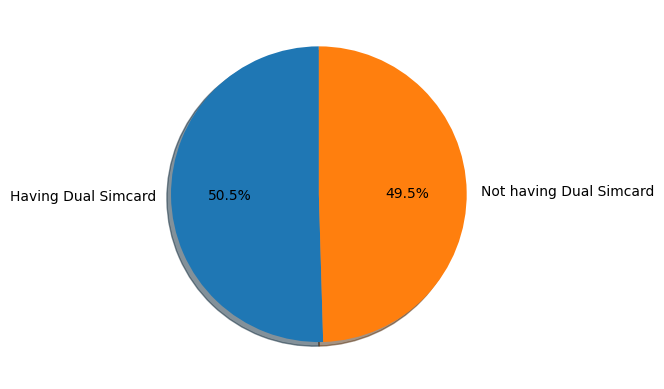

In [ ]:
# Pie Plot
values_dual_sim = df_train['dual_sim'].value_counts().values
labels_dual_sim = ['Having Dual Simcard', 'Not having Dual Simcard']

fig2, ax2 = plt.subplots()
ax2.pie(values_dual_sim, labels=labels_dual_sim, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**4G** column:

In [ ]:
# Counting unique values of a column
df_train['four_g'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['four_g'].value_counts()

four_g
1    851
0    758
Name: count, dtype: int64

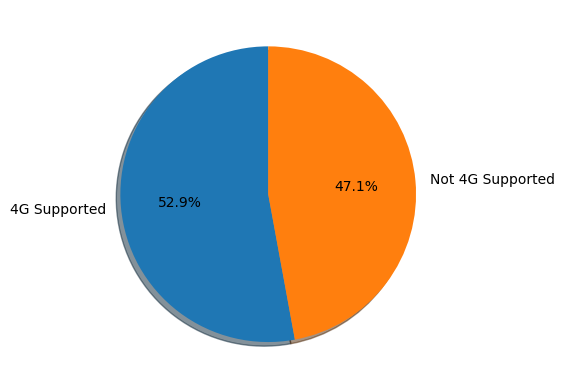

In [ ]:
# Pie Plot
values_4G = df_train['four_g'].value_counts().values
labels_4G = ['4G Supported', 'Not 4G Supported']

fig3, ax3 = plt.subplots()
ax3.pie(values_4G, labels=labels_4G, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**3G** column:

In [ ]:
# Counting unique values of a column
df_train['three_g'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['three_g'].value_counts()

three_g
1    1233
0     376
Name: count, dtype: int64

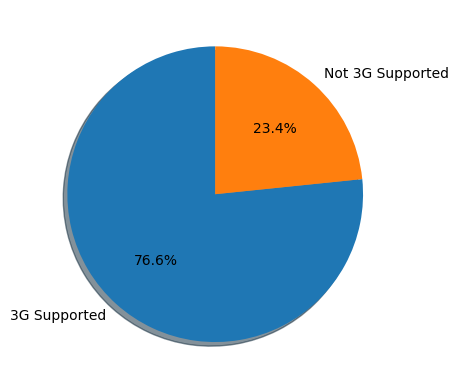

In [ ]:
# Pie Plot
values_3G = df_train['three_g'].value_counts().values
labels_3G = ['3G Supported', 'Not 3G Supported']

fig4, ax4 = plt.subplots()
ax4.pie(values_3G, labels=labels_3G, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**Touch Screen** column:

In [ ]:
# Counting unique values of a column
df_train['touch_screen'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['touch_screen'].value_counts()

touch_screen
1    814
0    795
Name: count, dtype: int64

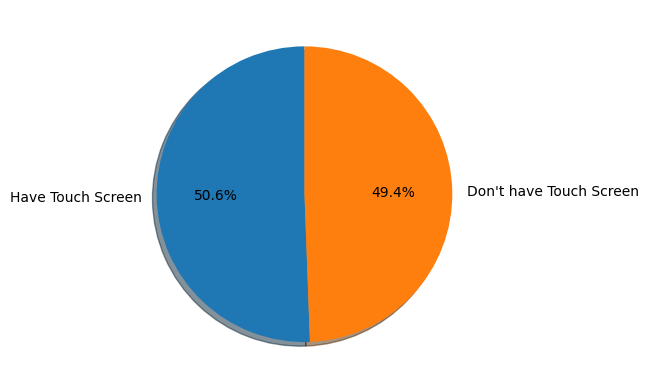

In [ ]:
# Pie Plot
values_touch_screen = df_train['touch_screen'].value_counts().values
labels_touch_screen = ['Have Touch Screen', "Don't have Touch Screen"]

fig5, ax5 = plt.subplots()
ax5.pie(values_touch_screen, labels=labels_touch_screen, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**WIFI** column:

In [ ]:
# Counting unique values of a column
df_train['wifi'].nunique()

2

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['wifi'].value_counts()

wifi
1    827
0    782
Name: count, dtype: int64

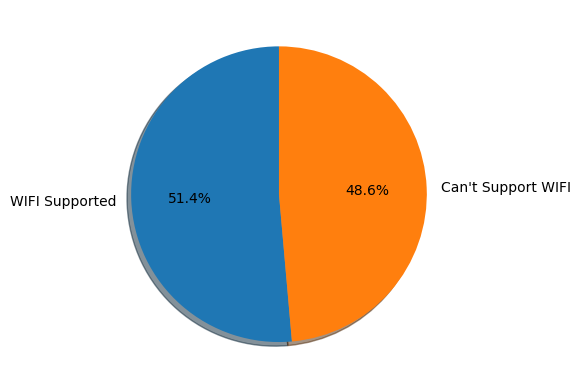

In [ ]:
# Pie Plot
values_wifi = df_train['wifi'].value_counts().values
labels_wifi = ['WIFI Supported', "Can't Support WIFI"]

fig6, ax6 = plt.subplots()
ax6.pie(values_wifi, labels=labels_wifi, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

**Number of Cores (Processors)** column:

In [ ]:
# Counting unique values of a column
df_train['n_cores'].nunique()

8

In [ ]:
# this will show us the distinct element and their number of occurence
df_train['n_cores'].value_counts()

n_cores
5    209
4    208
7    208
8    205
3    201
1    200
2    190
6    188
Name: count, dtype: int64

And if your column contains more than 2 values inside it, you can pie plot it as:

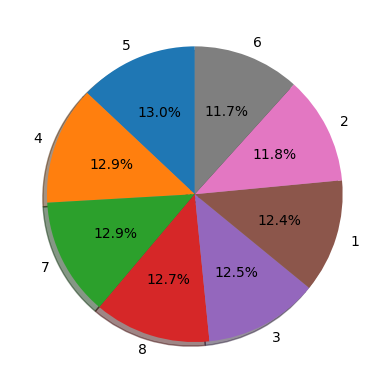

In [ ]:
# Pie Plot
values_n_cores = df_train['n_cores'].value_counts().values
labels_n_cores = ['5', '4', '7', '8', '3', '1', '2', '6']

fig7, ax7 = plt.subplots()
ax7.pie(values_n_cores, labels=labels_n_cores, autopct='%1.1f%%', shadow=True, startangle=90)
plt.show()

All these plots showed the circle (pie) of each feature and the labels on them are indicative of their contents.

***

### <span style="color:green">4-4. Pair plots</span>

We also can check for Noises inside this plots:

In [ ]:
FONT = {'fontsize':20, 'fontstyle':'normal', 'fontfamily':'Times New Roman', 'backgroundcolor':'#110122', 'color':'orange'} # for plot titling down, below

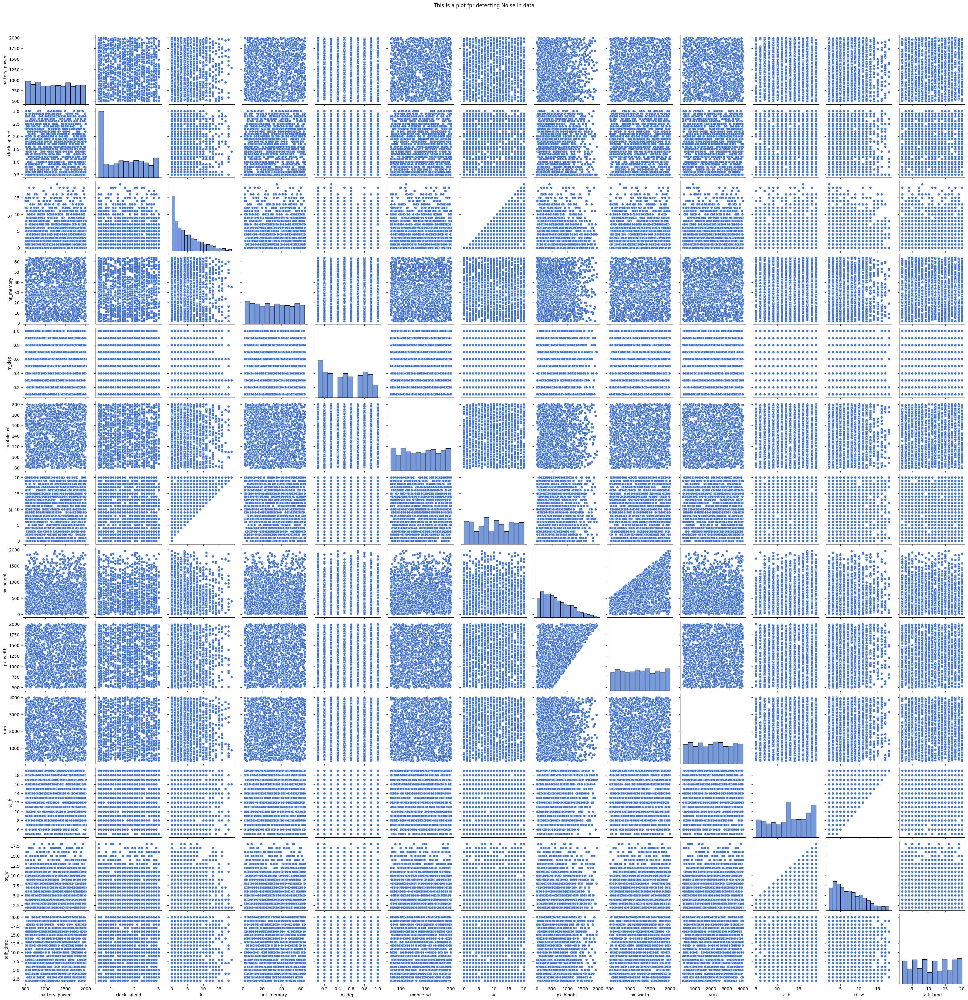

In [ ]:
sns.set_palette('muted') # deep, muted, pastel, dark, colorblind, summer

dnp = sns.pairplot(df_train.loc[:, ~df_train.columns.isin(features_categorical)])
dnp.fig.suptitle('This is a plot fpr detecting Noise in data' , y=1.02) #, **FONT

plt.show()

***

### <span style="color:green">4-5. Box plots</span>

Here is a dynamic box plot, in which you can select as you wish:

In [ ]:
import plotly.graph_objects as go

In [ ]:
fig = go.Figure()

for col in set(df_train.columns) - set(features_categorical):
    fig.add_trace(go.Box(x=df_train[col], name=col))

fig.update_layout(title_text='Box plot (for outliers)',
                  title_font=dict(color='navy',family='newtimeroman',size=30),
                  title_x=0.45,
                  #paper_bgcolor='#080114',
                  #plot_bgcolor='#DAF7A6',
                  font=dict(color='navy',family='newtimeroman', size=20)
                 )
fig.show()

- This is a dynamic plot.
- You can select the desired column/feature from the right menu and even select all if you wish.
- If you select several columns/features, the main page of the plot will show you only the selected feature or all the selected features.
- You can see the range of each feature from the x axis.
- If you go to any feature with your mouse, you can get more information (such as, min, q1, median, q3, and max of each column/feature).

***

Based on the **scatter** plots preceding the **box** plots, it is evident that outliers, observations deviating from the norm, are present. Some of these outliers are visible in the above box plots for certain columns. However, it's essential to note that outliers are considered innocent until proven guilty. Consequently, they shouldn't be removed unless there is a compelling reason to do so. While the pair plot analysis suggests the absence of noisy data, the box plot identifies some outliers that don't necessarily indicate noisy data. Consequently, no data removal is deemed necessary based on this evaluation.

***

## <span style="color:green">5. Pattern recognition</span>

### <span style="color:green">Exploratory Data Analysis (EDA)</span>

First, check for the distributions of columns:

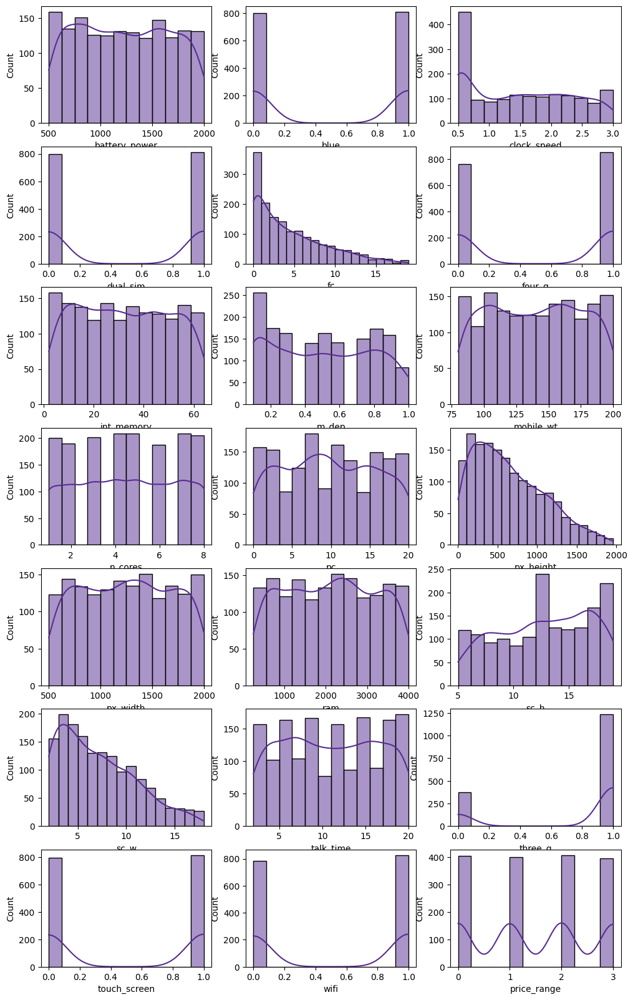

In [ ]:
sns.set_palette('Purples_r')

fig, ax = plt.subplots(7,3,figsize=(12,20))

for i, col in enumerate(df_train):
    sns.histplot(df_train[col], kde=True, ax=ax[i//3, i%3])

plt.show()

- As you can see, this plot shows the number of data in each column.
- So that the data distribution in each column can be seen.
- All the columns, including features and targets, are present in this counting plot with the number of 21 columns.
- Certain columns, such as 'battery_power', 'blue', 'dual_sim', 'four_g', 'int_memory', 'mobile_wt', 'n_cores', 'px_width', 'ram', 'touch_screen', 'wifi', and 'price_range', exhibit an almost uniform distribution.
- Other columns, including 'clock_speed', 'fc', 'm_dep', 'px_height', 'sc_h', 'sc_w', and 'three_g' display distribution plots skewed either to the left or right.
- Two specific columns, namely 'pc' and 'talk_time', demonstrate a non-uniform distribution.

We also use the following heatmap plot to check the correlation between the columns/features:

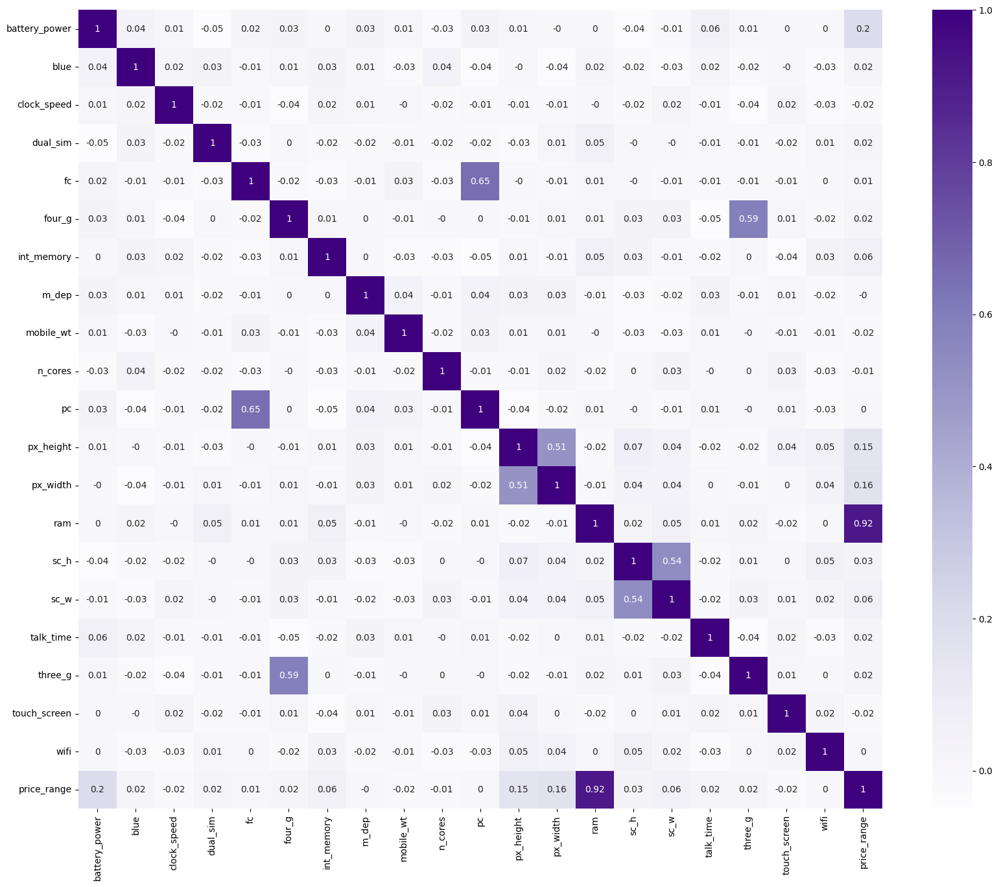

In [ ]:
plt.figure(figsize=(20,16))

sns.heatmap(round(df_train.corr(),2), cmap='Purples', annot=True)

plt.show()

- The higher the correlation between two columns is, the closer the correlation number is to 1, and the lower or no correlation between them, the closer the number is to 0.
- You can see significant coorelations between `fc & pc = 0.64` and `four_g & three_g = 0.58` and `ram & price_range = 0.92 (as we said earlier in the first scatter plots!)` and `sc_h & sc_w = 0.51`.

***

### <span style="color:green">5-1. Univariate Analysis</span>

Now we have univariate analysis of categorical data/columns:

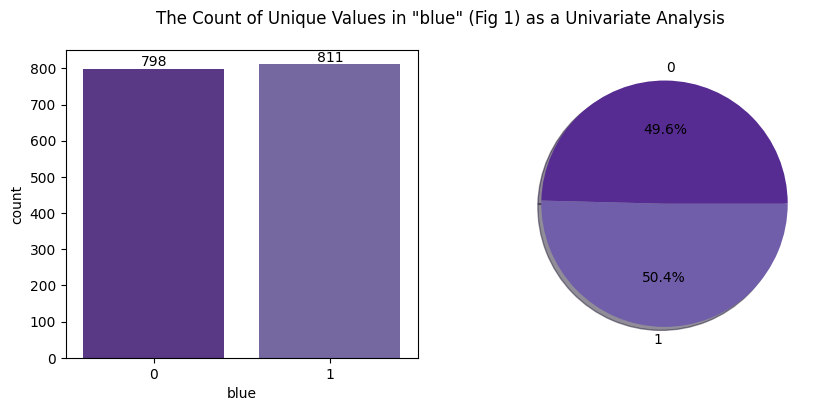

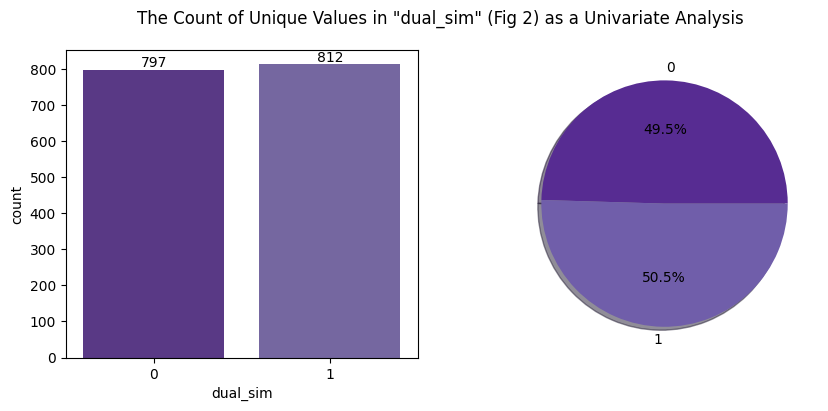

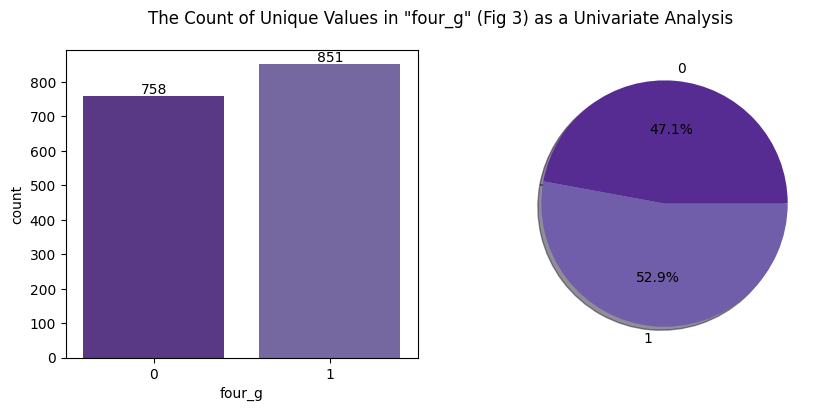

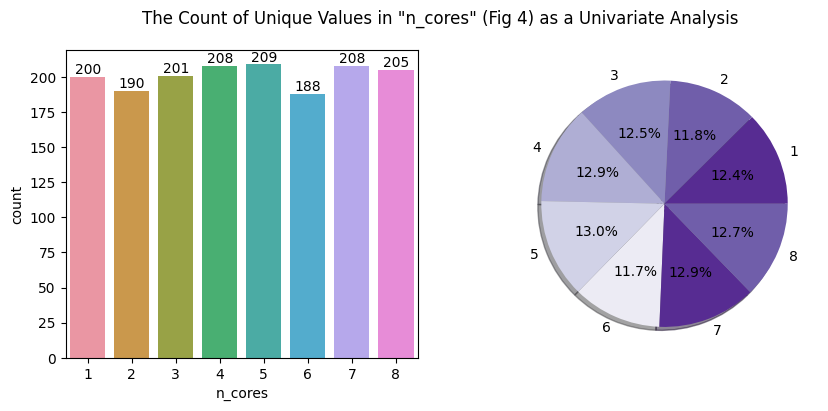

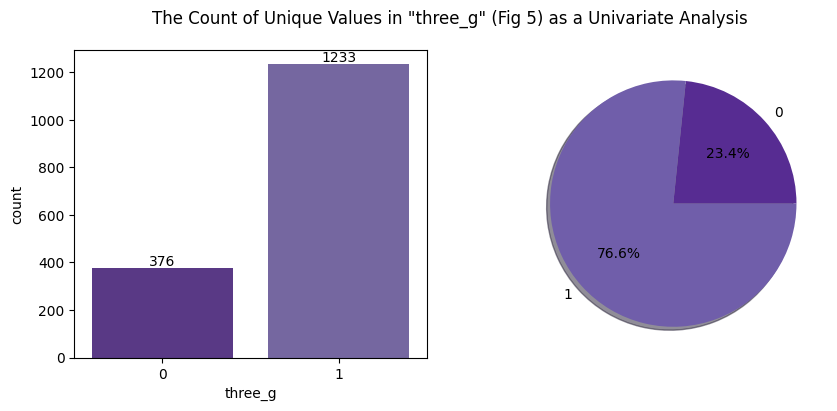

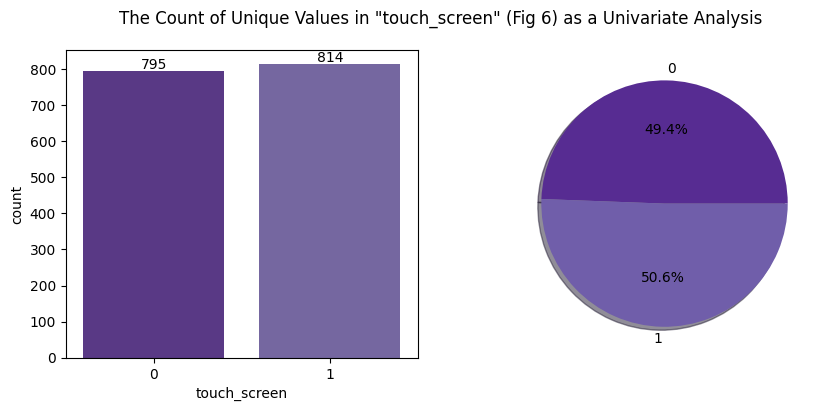

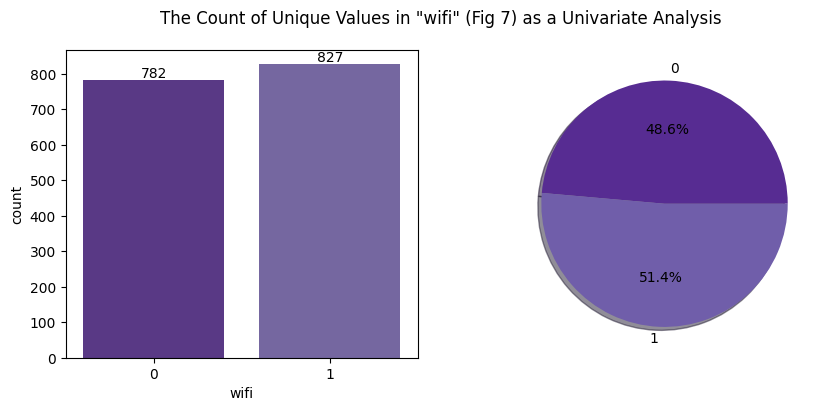

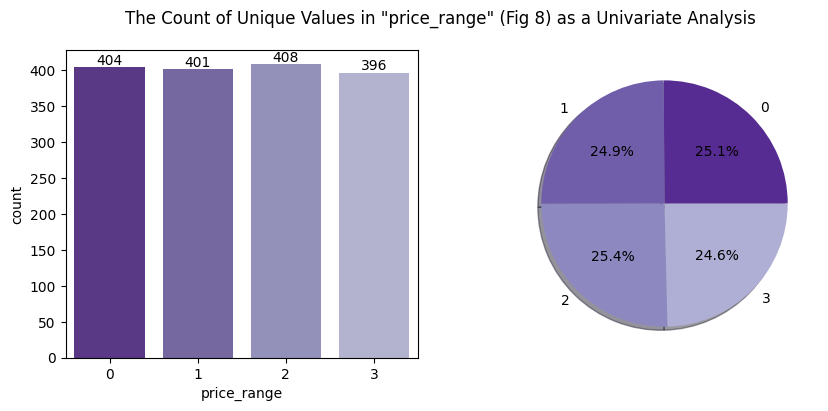

In [ ]:
sns.set_palette("Purples_r")

for i, col in enumerate(features_categorical):
    fig, axes = plt.subplots(1,2,figsize=(10,4))
    # count of colimns (count plot)
    sns.countplot(data=df_train, x=col, ax=axes[0])
    for container in axes[0].containers:
        axes[0].bar_label(container)
    # count of col (pie chart)
    slices = df_train[col].value_counts().sort_index().values
    activities = [var for var in df_train[col].value_counts().sort_index().index]
    axes[1].pie(slices, labels=activities, shadow=True, autopct='%1.1f%%')

    plt.suptitle(f'The Count of Unique Values in "{col}" (Fig {i+1}) as a Univariate Analysis')
    plt.show()

- All the explanations are crystal clear within the plots on their own but,
- We can say that a majority of mobiles (76.2%) are equipped with at least 'three_g' capabilities.
- Each 'price_range' contains precisely 500 samples, ensuring a balanced distribution and eliminating concerns about class imbalance in the target variable.

Now that we have univariate analysis of numerical data/columns,<br>
We check the descibe of them,

In [ ]:
df_train[features_numerical].describe().T

- Everything looks clear here in the table as well.

***

### <span style="color:green">5-2. Bivariate Analysis</span>

Count plot of target based on the categorical features:

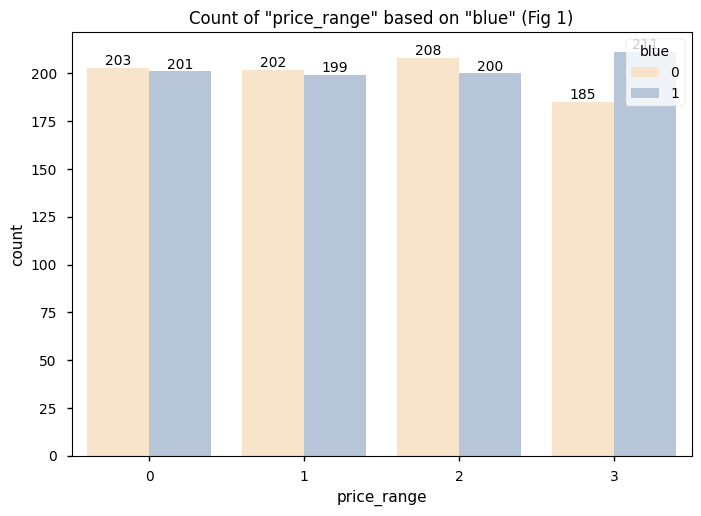

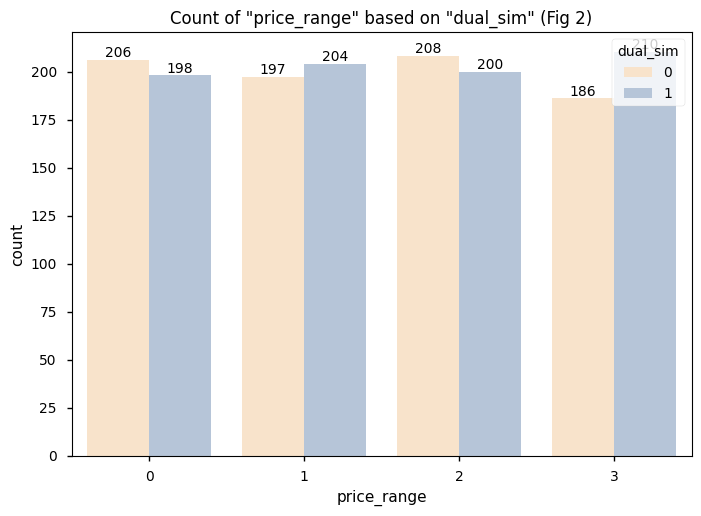

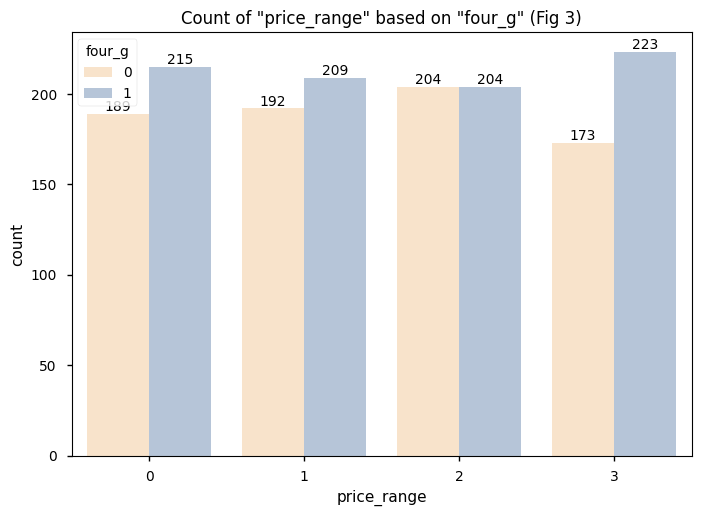

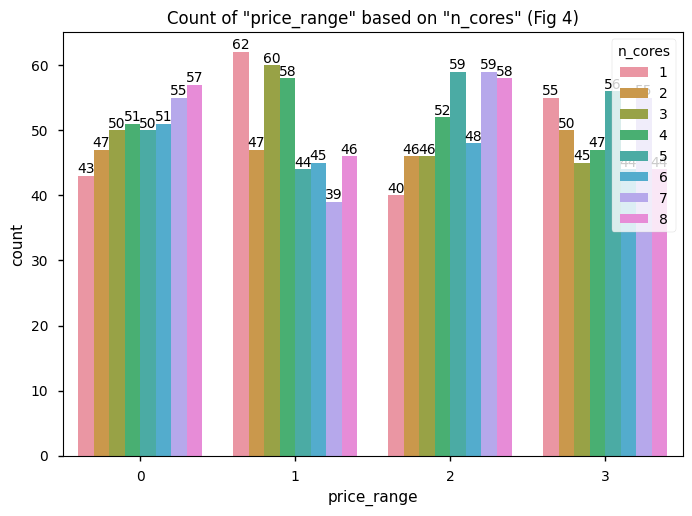

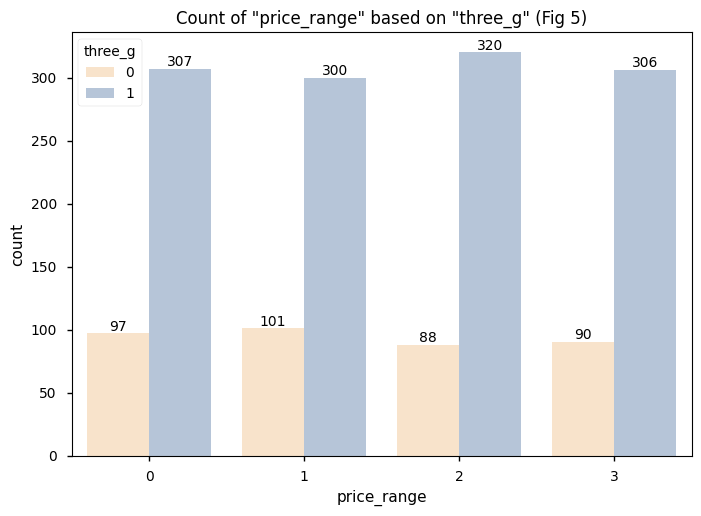

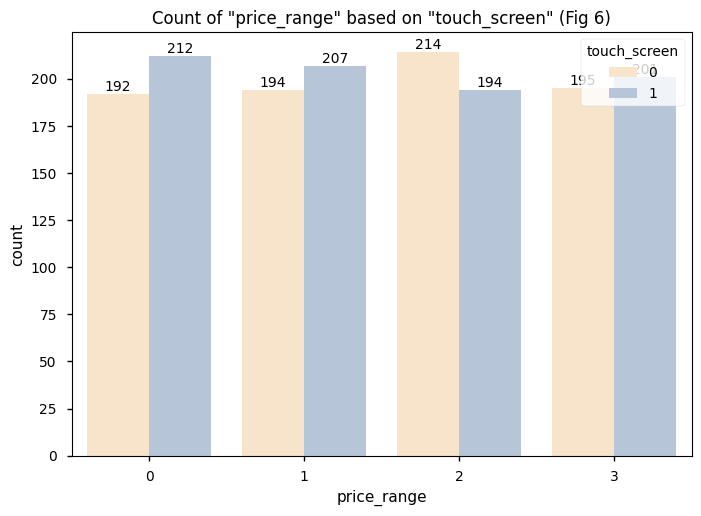

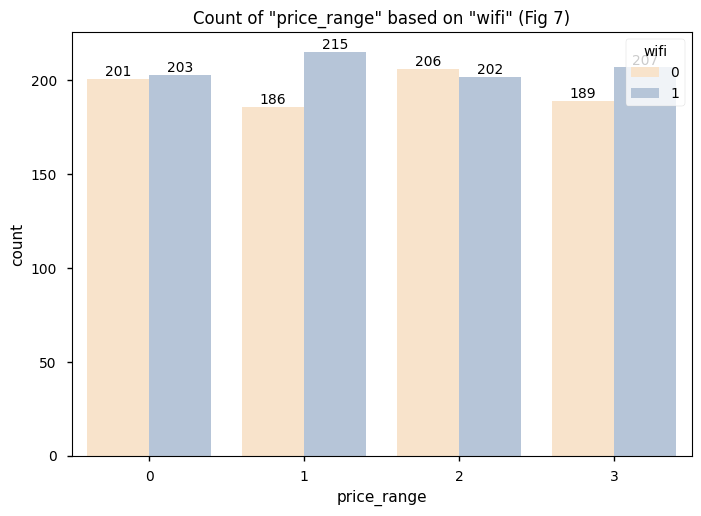

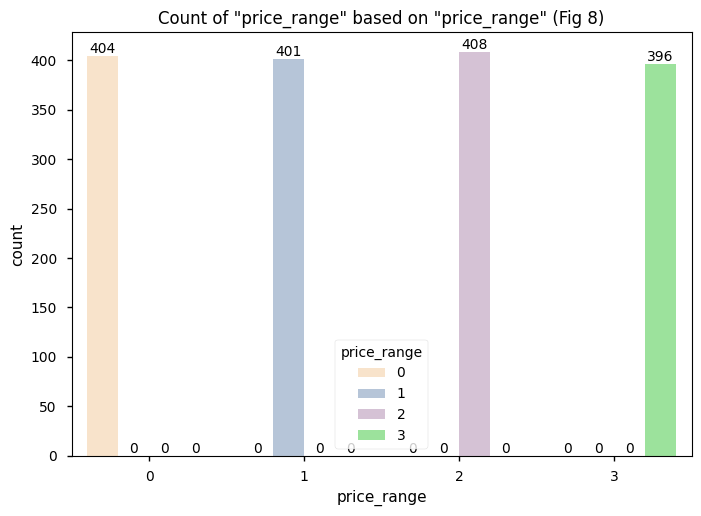

In [ ]:
plt.style.use('seaborn-notebook')

sns.set_palette(['bisque', 'lightsteelblue', 'thistle', 'lightgreen'])

for i, col in enumerate(features_categorical):
    ax = sns.countplot(data=df_train, x='price_range', hue=col)
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(f'Count of "price_range" based on "{col}" (Fig {i+1})')
    plt.show()

 - **Figure 1:** The majority of mobiles falling within 'price_range' 0, 1, and 2 are equipped with Bluetooth, whereas most mobiles in 'price_range' 3 lack Bluetooth functionality.
 - **Figure 2:** For 'price_ranges' 1 and 3, mobile devices are predominantly equipped with dual sim capabilities.
 - **Figure 3:** Within 'price_ranges' 0, 1, and 3, mobiles primarily feature 'four_g' connectivity.
 - **Figure 4:** This plot represents the exact count of the number of cores that the cell phone has. You can see that there is 8 different cores.
 - **Figure 5:** Across all 'price_ranges', mobiles predominantly support 'three_g' connectivity.
 - **Figure 6:** For 'price_ranges' 0 and 1, mobile devices are mainly equipped with touch screens, while in 'price_range' 3, mobiles predominantly lack touch screen functionality.
 - **Figure 7:** In 'price_range' 3, mobile devices mostly lack wifi capabilities.
 - **Figure 8:** Plotting the count of the target reveals nothing particularly special, except for the fact that we have four categories for all types of cellphones.

**Kernel Density Estimation (KDE) of numerical features based on the target:**

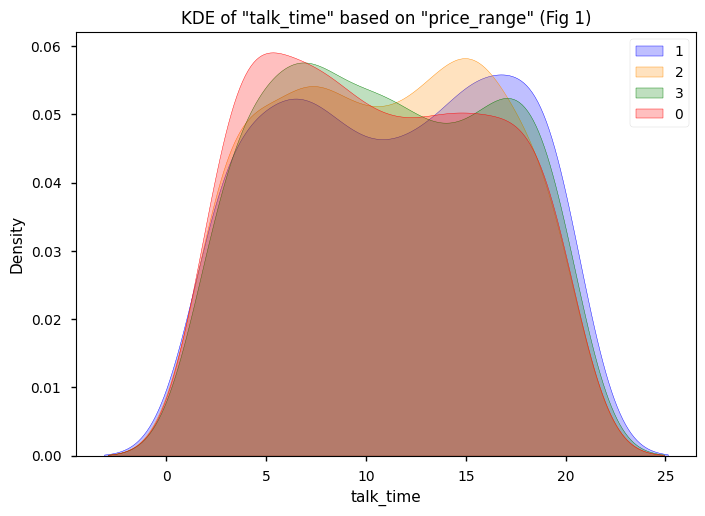

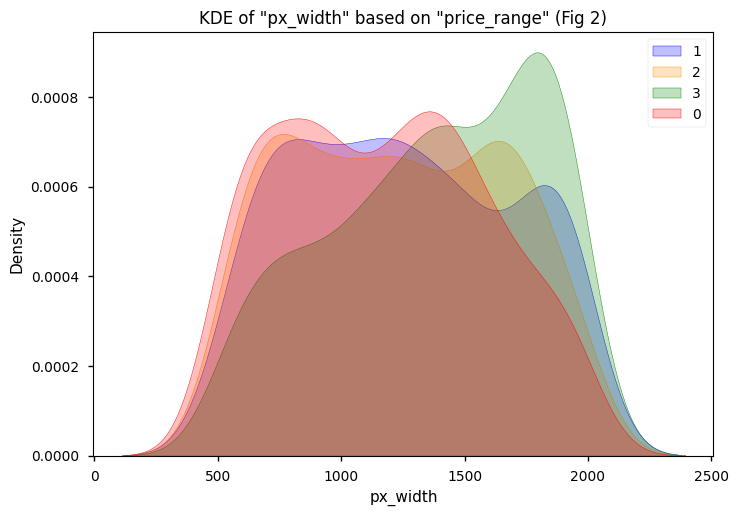

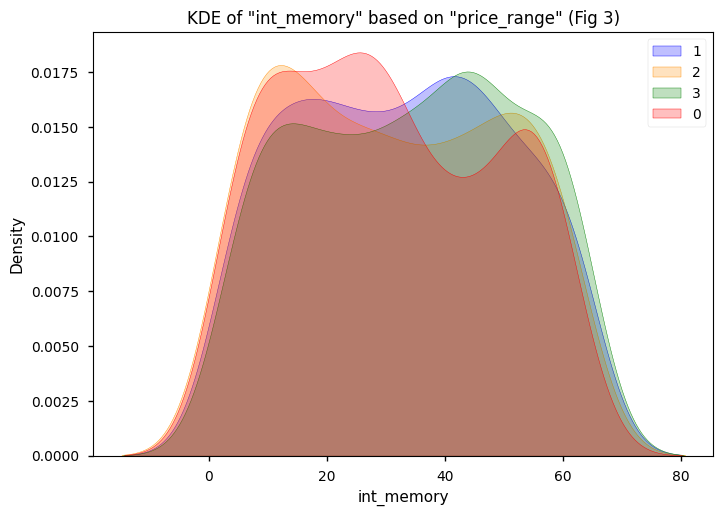

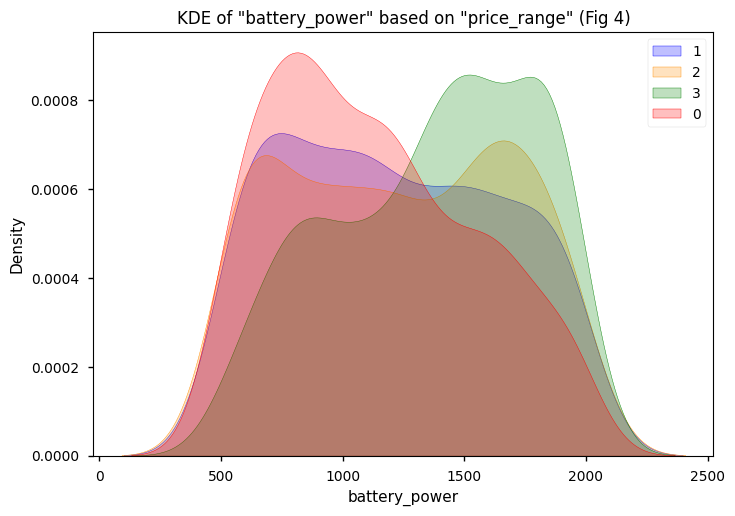

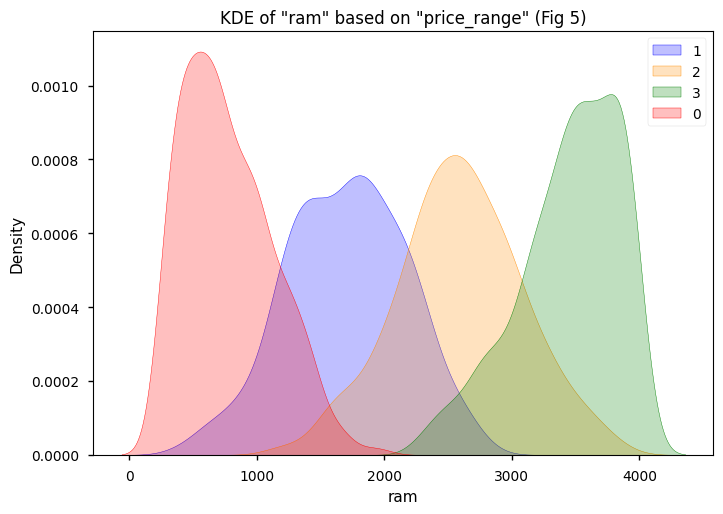

...

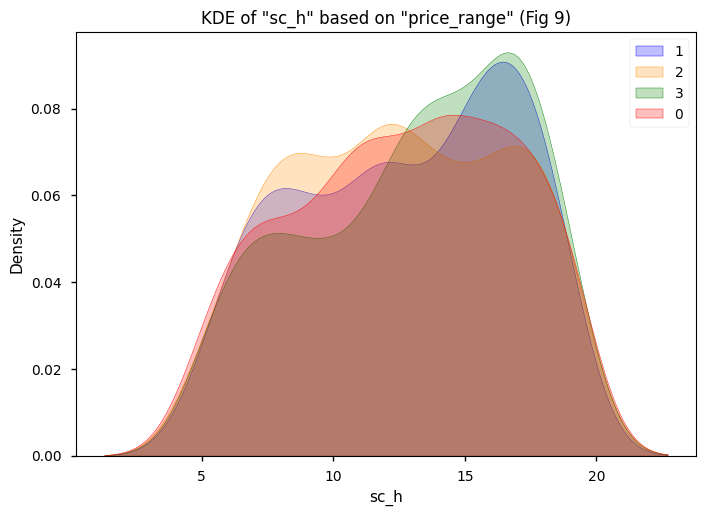

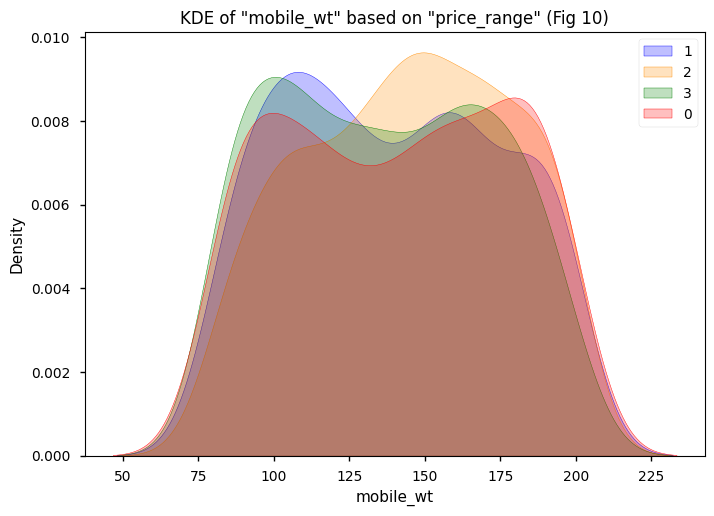

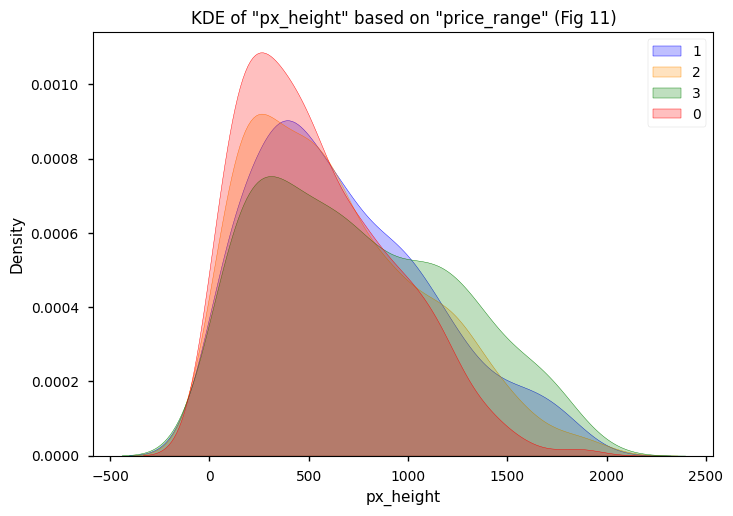

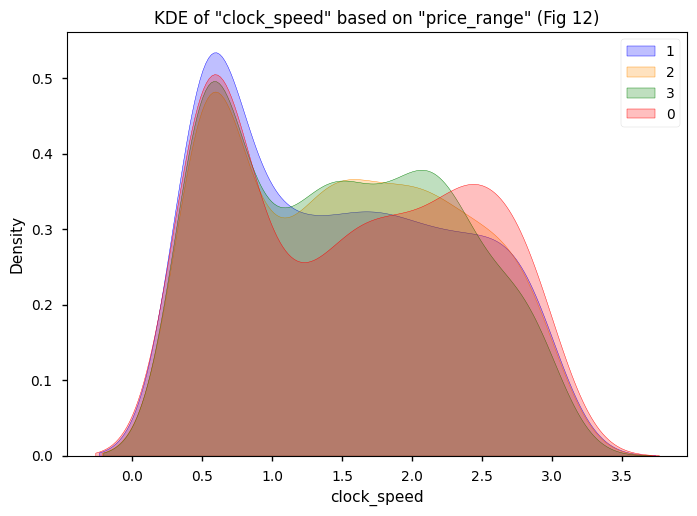

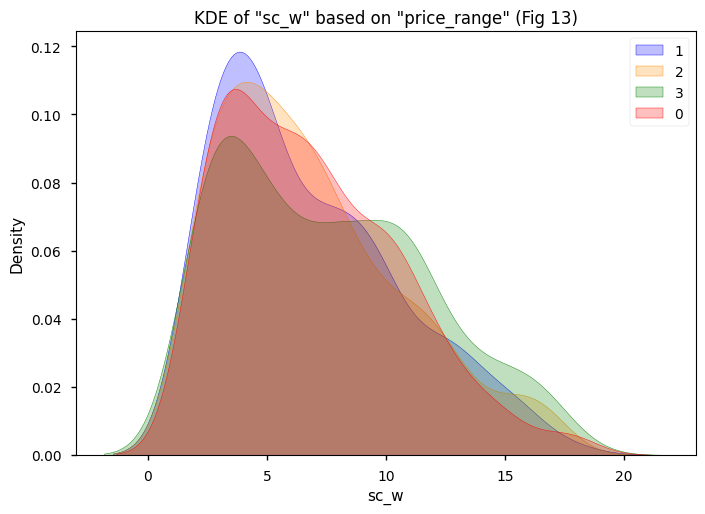

In [ ]:
plt.style.use('seaborn-notebook')

sns.set_palette(['blue', 'darkorange', 'green', 'red'])

for j, col in enumerate(features_numerical):
    for i, label in enumerate(df_train['price_range'].unique().tolist()):
        sns.kdeplot(df_train.loc[df_train['price_range'] == label, col], label=label, shade=True)
    plt.title(f'KDE of "{col}" based on "price_range" (Fig {j+1})')
    plt.legend()
    plt.show()

- **In Figure 1:** High-priced mobiles ('price_range'=3, very expensives) predominantly feature a 'px_width' of around 1800.
- **In Figure 2:** Across all price ranges, most mobile devices maintain an 'm_dep' of approximately 0.15 cm.
- **In Figure 3:** Within all 'price_range', most mobile devices boast an 'sc_w' ranging between 3 and 4.
- **In Figure 4:** This plot shows its maximum values at both 5h and 16h in 'talk_time', and it is interesting!
- **In Figure 5:** The majority of mobile devices in every price range exhibit a 'clock_speed' between 0.5 and 0.75.
- **In Figure 6:** This feature exhibits numerous variations, yet the range is between 90 and 180.
- **In Figure 7:** Same as above but 10-50.
- **In Figure 8:** Across all 'price_range', the majority of mobile devices exhibit an 'fc' of approximately 1.
- **In Figure 9:** We have a distinct peak at 17.
- **In Figure 10:** Mobiles with 'price_range' (=3) commonly have a 'battery_power' ranging from 1500 to 1700, whereas those with 'price_range' (=0) typically fall within the 600-800 'battery_power' range.
- **In Figure 11:** It is evident that mobile prices are directly correlated with 'ram', as lower-priced (cheaper ones) mobiles tend to have less 'ram', and vice versa.
- **In Figure 12:** For all 'price_ranges', the prevalent 'px_height' for most mobile devices is around 250-300.

***

### <span style="color:green">5-3. Multivariate Analysis</span>

Now we would like to plot the Pair plot for multivariate analysis:

In [ ]:
sns.set_palette(['cadetblue','orchid','gold','indianred'])

splot = sns.pairplot(data=df_train,
                     x_vars=features_numerical,
                     y_vars=features_numerical,
                     hue='price_range'
                    )

plt.show()

Here we want to draw a plot in which I take the feature with the highest correlation with the target and instead of drawing it next to the rest of the features, we place it on the opposite axis and draw the rest of the features based on it.

**Based on numerical features:**

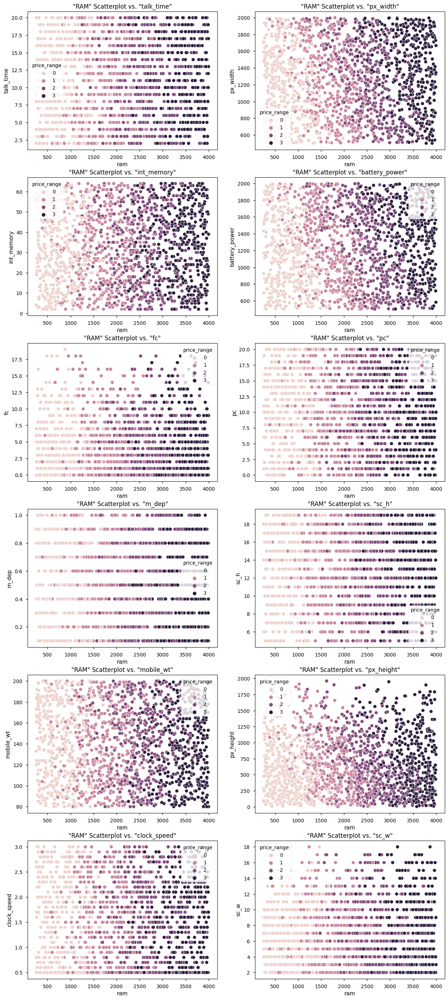

In [ ]:
fig, ax = plt.subplots(6,2,figsize=(15,35))

features_numerical_2 = features_numerical.copy()

features_numerical_2.remove('ram')

for i, col in enumerate(features_numerical_2):
    sns.scatterplot(data=df_train,
                    x='ram', # we took out the highest correlation part and then we put in here as an axis to plot the plots
                    y=col,
                    hue='price_range',
                    ax=ax[i//2, i%2]
                   )
    ax[i//2, i%2].set_title(f'"RAM" Scatterplot vs. "{col}"',y=1.00)

plt.show()

**Based on categorical features:**

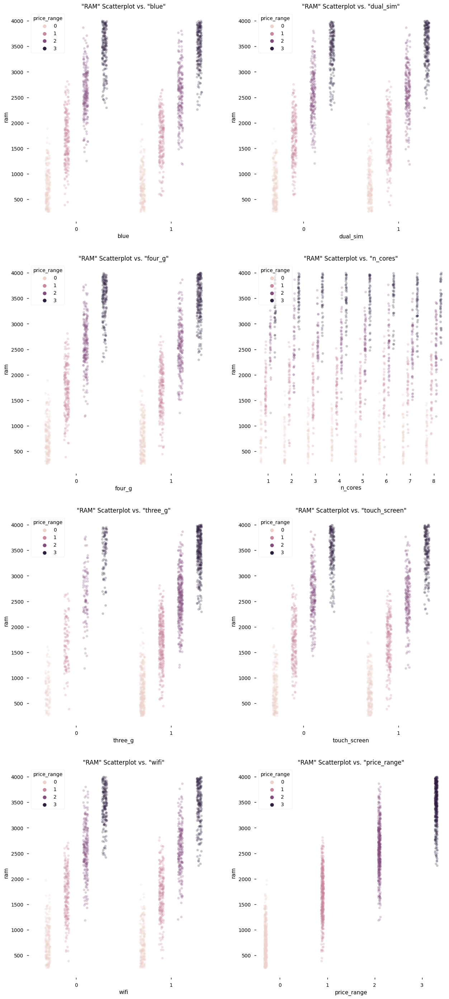

In [ ]:
fig, ax = plt.subplots(4,2,figsize=(15,35))

sns.despine(bottom=True, left=True)

for i, col in enumerate(features_categorical):
    sns.stripplot(data=df_train,
                  x=col,
                  y='ram',
                  hue='price_range',
                  dodge=True,
                  jitter=True,
                  alpha=.25,
                  zorder=1,
                  ax=ax[i//2, i%2]
                 )
    ax[i//2, i%2].set_title(f'"RAM" Scatterplot vs. "{col}"',y=1.00)

plt.show()

***

## <span style="color:green">6. Implementing models such as DTs, RF, and SVM</span>

In [ ]:
df_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1604,858,0,2.2,0,1,0,50,0.1,84,1,...,528,1416,3978,17,16,3,1,1,0,3
1605,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1606,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1607,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [ ]:
df_test

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
2,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1
3,6,1464,1,2.9,1,5,1,50,0.8,198,...,9,569,939,3506,10,7,3,1,1,1
4,7,1718,0,2.4,0,1,0,47,1.0,156,...,3,1283,1374,3873,14,2,10,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,994,567,1,2.7,1,14,1,56,0.4,165,...,17,555,1290,336,7,6,7,1,1,1
783,995,936,1,1.4,1,0,0,46,0.8,139,...,0,265,886,684,8,5,12,1,1,1
784,996,1700,1,1.9,0,0,1,54,0.5,170,...,17,644,913,2121,14,8,15,1,1,0
785,999,1533,1,0.5,1,0,0,50,0.4,171,...,12,38,832,2509,15,11,6,0,1,0


### <span style="color:green">Normalizing</span>

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
mms1 = MinMaxScaler()
df_train[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']] = mms1.fit_transform(df_train[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']])
df_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,0.227789,0,0.68,0,0.052632,0,0.080645,0.555556,0.900000,0.142857,...,0.009193,0.170895,0.612774,0.285714,0.3125,0.944444,0,0,1,1
1,0.347361,1,0.00,1,0.000000,1,0.822581,0.666667,0.466667,0.285714,...,0.461185,0.993324,0.634687,0.857143,0.0625,0.277778,1,1,0,2
2,0.041416,1,0.00,1,0.105263,1,0.629032,0.888889,0.541667,0.571429,...,0.644025,0.811749,0.627205,0.428571,0.0000,0.388889,1,1,0,2
3,0.076152,1,0.80,0,0.000000,0,0.129032,0.777778,0.425000,0.714286,...,0.620020,0.858478,0.671566,0.785714,0.3750,0.500000,1,0,0,2
4,0.881764,1,0.28,0,0.684211,1,0.677419,0.555556,0.508333,0.142857,...,0.615935,0.475300,0.308658,0.214286,0.0000,0.722222,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1604,0.238477,0,0.68,0,0.052632,0,0.774194,0.000000,0.033333,0.000000,...,0.268641,0.611482,0.994655,0.857143,0.8750,0.055556,1,1,0,3
1605,0.195725,1,0.00,1,0.000000,1,0.000000,0.777778,0.216667,0.714286,...,0.623085,0.927904,0.110102,0.571429,0.1250,0.944444,1,1,0,0
1606,0.977956,1,0.84,1,0.000000,0,0.596774,0.111111,0.891667,0.428571,...,0.466292,0.977971,0.474613,0.428571,0.5000,0.777778,1,1,1,2
1607,0.675351,0,0.16,0,0.210526,1,0.709677,0.000000,0.541667,0.571429,...,0.170582,0.113485,0.163816,0.928571,0.5000,0.944444,1,1,1,0


In [ ]:
mms2 = MinMaxScaler()
df_test[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']] = mms2.fit_transform(df_test[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']])
df_test

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,0.362241,1,0.52,1,0.736842,0,0.048387,0.000000,0.941667,...,0.80,0.117585,0.608550,0.862319,0.500000,0.3125,0.000000,0,1,0
1,3,0.871915,1,0.92,0,0.052632,0,0.403226,0.888889,0.883333,...,0.20,0.665617,0.577822,0.572464,0.857143,0.5000,0.444444,0,1,1
2,5,0.623082,0,0.36,0,0.578947,1,0.758065,0.444444,0.233333,...,0.90,0.392126,0.206413,0.405260,0.714286,0.3750,0.277778,1,0,1
3,6,0.643095,1,0.96,1,0.263158,1,0.774194,0.777778,0.983333,...,0.45,0.297638,0.292585,0.870370,0.357143,0.3125,0.055556,1,1,1
4,7,0.812542,0,0.76,0,0.052632,0,0.725806,1.000000,0.633333,...,0.15,0.672441,0.583166,0.968867,0.642857,0.0000,0.444444,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,994,0.044696,1,0.88,1,0.736842,1,0.870968,0.333333,0.708333,...,0.85,0.290289,0.527054,0.019592,0.142857,0.2500,0.277778,1,1,1
783,995,0.290861,1,0.36,1,0.000000,0,0.709677,0.777778,0.491667,...,0.00,0.138058,0.257181,0.112990,0.214286,0.1875,0.555556,1,1,1
784,996,0.800534,1,0.56,0,0.000000,1,0.838710,0.444444,0.750000,...,0.85,0.337008,0.275217,0.498658,0.642857,0.3750,0.722222,1,1,0
785,999,0.689126,1,0.00,1,0.000000,0,0.774194,0.333333,0.758333,...,0.60,0.018898,0.221109,0.602791,0.714286,0.5625,0.222222,0,1,0


***

### <span style="color:green">6-1. Decision Trees</span>

In [ ]:
Xd = df_train.drop('price_range', axis=1)
yd = df_train.price_range.values.reshape(-1, 1)

In [ ]:
def DTs(Xd, yd, Testsize, mdepth):
    df_evaluation = pd.DataFrame()
    for x in Testsize:
        X_train, X_test, y_train, y_test = train_test_split(Xd, yd, test_size=x, random_state=0)
        for maxdepth in mdepth:
            clf = DecisionTreeClassifier(max_depth=maxdepth)
            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)
            dict = {'Test_size':x,'Max_depth':maxdepth,'acc':metrics.accuracy_score(y_test,y_pred),"score":clf.score(Xd,yd)}
            df_evaluation = df_evaluation.append(dict, ignore_index=True)
    return(df_evaluation)
# This function highlights Maximum values
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

In [ ]:
df_evaluation = DTs(Xd,yd,[.1,.15,.2,.25,.3],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20])
df_evaluation.style.apply(highlight_max)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(Xd, yd, test_size=.1, random_state=0)

In [ ]:
clf = DecisionTreeClassifier(max_depth=19, criterion='entropy')
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
print('Accuracy = ', metrics.accuracy_score(y_test, y_pred))

Accuracy =  0.8385093167701864


***

***

### <span style="color:green">6-3. SVM (Support Vector Machine)</span>

In [ ]:
Xs = df_train.drop('price_range', axis=1)
ys = df_train.price_range.values.reshape(-1, 1)

In [ ]:
def svc(Xs, ys, Testsize):
    df_evaluation_svm = pd.DataFrame()
    for x in Testsize:
        X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=x, random_state=0)
        svm = SVC(kernel='linear')
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_test)
        dict = {'Test_size':x,'acc':metrics.accuracy_score(y_test,y_pred),"score":svm.score(Xs,ys)}
        df_evaluation_svm = df_evaluation_svm.append(dict, ignore_index=True)
    return(df_evaluation_svm)

In [ ]:
df_evaluation_svm = svc(Xs,ys,[.1,.15,.2,.25,.3])
df_evaluation_svm.style.apply(highlight_max)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=.2, random_state=0)

clf = SVC(C=0.75, decision_function_shape='ovo', gamma='auto', kernel='linear', random_state=2)
clf2 = clf.fit(X_train, y_train)
y_pred = clf2.predict(X_test)
print('Accuracy = ', metrics.accuracy_score(y_test, y_pred))

Accuracy =  0.9254658385093167


***

## <span style="color:green">7. Get the second dataset predicted results</span>

In [ ]:
df_test = df_test.drop('id', axis=1)

In [ ]:
Last_one = clf2.predict(df_test)

In [ ]:
Last_one

array([3, 2, 1, 3, 3, 1, 3, 3, 3, 0, 2, 0, 2, 1, 3, 3, 1, 3, 0, 2, 0, 3,
       0, 2, 0, 3, 0, 1, 1, 3, 1, 1, 1, 2, 0, 0, 1, 3, 1, 1, 0, 0, 3, 0,
       3, 1, 3, 3, 1, 2, 1, 2, 1, 2, 2, 3, 0, 0, 1, 0, 3, 3, 0, 3, 0, 3,
       1, 3, 1, 2, 1, 0, 2, 2, 0, 0, 3, 0, 2, 0, 1, 2, 3, 3, 3, 3, 3, 3,
       2, 3, 0, 0, 3, 2, 1, 2, 0, 2, 2, 2, 2, 2, 1, 3, 1, 1, 1, 1, 3, 3,
       2, 2, 3, 2, 3, 2, 3, 3, 2, 3, 3, 2, 3, 3, 3, 1, 3, 0, 1, 0, 1, 0,
       0, 1, 2, 1, 0, 0, 1, 2, 2, 1, 0, 0, 1, 0, 1, 0, 2, 3, 3, 2, 2, 2,
       3, 2, 1, 0, 0, 1, 3, 1, 2, 3, 0, 2, 0, 3, 2, 3, 0, 1, 0, 3, 0, 0,
       2, 2, 1, 3, 3, 0, 3, 1, 2, 0, 0, 1, 3, 2, 3, 0, 0, 2, 3, 1, 3, 1,
       3, 1, 2, 3, 3, 1, 0, 1, 3, 1, 1, 3, 2, 0, 0, 1, 3, 0, 0, 3, 2, 3,
       3, 2, 3, 3, 2, 1, 1, 0, 2, 0, 0, 3, 0, 3, 0, 1, 2, 0, 2, 3, 1, 3,
       2, 1, 0, 0, 1, 3, 2, 0, 1, 0, 3, 0, 2, 3, 1, 2, 2, 2, 1, 3, 3, 1,
       2, 3, 3, 3, 3, 3, 1, 3, 3, 0, 1, 1, 3, 1, 2, 3, 0, 0, 0, 0, 2, 0,
       2, 2, 2, 2, 0, 0, 0, 3, 0, 3, 2, 2, 1, 2, 3,

In [ ]:
df_test['Price_range'] = Last_one

In [ ]:
df_test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,Price_range
0,0.362241,1,0.52,1,0.736842,0,0.048387,0.000000,0.941667,0.285714,...,0.117585,0.608550,0.862319,0.500000,0.3125,0.000000,0,1,0,3
1,0.871915,1,0.92,0,0.052632,0,0.403226,0.888889,0.883333,0.285714,...,0.665617,0.577822,0.572464,0.857143,0.5000,0.444444,0,1,1,2
2,0.623082,0,0.36,0,0.578947,1,0.758065,0.444444,0.233333,0.714286,...,0.392126,0.206413,0.405260,0.714286,0.3750,0.277778,1,0,1,1
3,0.643095,1,0.96,1,0.263158,1,0.774194,0.777778,0.983333,1.000000,...,0.297638,0.292585,0.870370,0.357143,0.3125,0.055556,1,1,1,3
4,0.812542,0,0.76,0,0.052632,0,0.725806,1.000000,0.633333,0.142857,...,0.672441,0.583166,0.968867,0.642857,0.0000,0.444444,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,0.044696,1,0.88,1,0.736842,1,0.870968,0.333333,0.708333,1.000000,...,0.290289,0.527054,0.019592,0.142857,0.2500,0.277778,1,1,1,0
783,0.290861,1,0.36,1,0.000000,0,0.709677,0.777778,0.491667,0.142857,...,0.138058,0.257181,0.112990,0.214286,0.1875,0.555556,1,1,1,0
784,0.800534,1,0.56,0,0.000000,1,0.838710,0.444444,0.750000,0.857143,...,0.337008,0.275217,0.498658,0.642857,0.3750,0.722222,1,1,0,2
785,0.689126,1,0.00,1,0.000000,0,0.774194,0.333333,0.758333,0.142857,...,0.018898,0.221109,0.602791,0.714286,0.5625,0.222222,0,1,0,2
